In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from datetime import date, timedelta
from sklearn.model_selection import train_test_split
import xgboost as xgb
from xgboost.sklearn import XGBRegressor
from sklearn.preprocessing import MinMaxScaler 
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn import metrics
import pickle

pd.set_option('display.max_rows',None)

In [2]:
## Used with permission from Analytics Vidhya (modified)
def modelfit(alg, X_train, y_train, target, predictors,useTrainCV=True, cv_folds=5, early_stopping_rounds=50):
    
    if useTrainCV:
        xgb_param = alg.get_xgb_params()
        xgtrain = xgb.DMatrix(X_train[predictors].values, label=y_train[target].values)
        cvresult = xgb.cv(xgb_param, xgtrain, num_boost_round=alg.get_params()['n_estimators'], nfold=cv_folds,
            metrics='mae', early_stopping_rounds=early_stopping_rounds)
        alg.set_params(n_estimators=cvresult.shape[0],eval_metric='mae')
    
    #Fit the algorithm on the data
    alg.fit(X_train[predictors], y_train[target])
        
    #Predict training set:
    dtrain_predictions = alg.predict(X_train[predictors])
        
    #Print model report:
    print ("\nModel Report")
    print ("MSE : %.4g" % metrics.mean_squared_error(y_train[target].values, dtrain_predictions))
    print ("MAE : %.4g" % metrics.mean_absolute_error(y_train[target].values, dtrain_predictions))
    print ("MAPE : %.4g" % metrics.mean_absolute_percentage_error(y_train[target].values, dtrain_predictions))
    print ("Max Error : %.4g" % metrics.max_error(y_train[target].values, dtrain_predictions))
                    
    feat_imp = pd.Series(alg.get_booster().get_score(importance_type='gain')).sort_values(ascending=False)
    feat_imp.plot(kind='bar', title='Feature Importances')
    plt.ylabel('Feature Importance Score')
    plt.show()
    print()

In [3]:
# Load your dataset
df = pd.read_csv("../Maverik_Capstone/data/merged_data.csv", index_col=0)  # Replace with your data file path
cat = pd.read_csv("../Maverik_Capstone/data/qualitative_data_msba_clean.csv")
print(cat.shape)
clust = pd.read_csv('../Maverik_Capstone/data/clusters.csv', index_col=0) # Cluster data
df = pd.merge(df, clust, on='site_id_msba', how='left')
print(df.shape)

(37, 55)
(13542, 65)


In [18]:
np.random.seed(1234)
test_idx = list(np.random.randint(0,len(cat),5))
out_store = cat.loc[1]['site_id_msba']
test = cat.loc[test_idx]['site_id_msba']
print(test.values) # stores to remove for testing
print(clust.loc[clust.site_id_msba.isin(test.values)])
print(out_store)

[22925 22680 23415 22785 23380]
    site_id_msba  cluster
12         22680        4
15         22785        0
19         22925        4
24         23380        0
25         23415        3
21980


In [8]:
test

19    22925
12    22680
24    23415
15    22785
23    23380
Name: site_id_msba, dtype: int64

In [5]:
df['cal.day'] = pd.DatetimeIndex(df['calendar.calendar_day_date']).day
df['cal.month'] = pd.DatetimeIndex(df['calendar.calendar_day_date']).month
df['cal.year'] = pd.DatetimeIndex(df['calendar.calendar_day_date']).year

In [6]:
df = df[['site_id_msba', # ID Variable
         'calendar.calendar_day_date', # Date Variable
           # Target Variables
           'inside_sales',
           'food_service',
           'diesel_x', 
           'unleaded',
           # Predictor Variables
           'cluster',
           'calendar.fiscal_week_id_for_year',
           'calendar.day_of_week',
           'x1_mile_pop', 
           'x1_mile_emp',
           'x1_mile_income', 
           'x1_2_mile_pop', 
           'x1_2_mile_emp', 
           'x1_2_mile_income',
           'x5_min_pop', 
           'x5_min_emp', 
           'x5_min_inc', 
           'x7_min_pop', 
           'x7_min_emp',
           'x7_min_inc', 
           'traditional_forecourt_fueling_positions',
           'calendar_information.holiday',
           'cal.month',
           # Other Predictor Variables
#            'square_feet',
#            'front_door_count', 
#            'parking_spaces',
           'lottery', 
#            'freal', 
           'bonfire_grill', 
           'pizza', 
#            'cinnabon',
#            'godfather_s_pizza', 
           'ethanol_free', 
#            'diesel_y', 
           'hi_flow_lanes',
#            'rv_lanes', 
           'hi_flow_rv_lanes', 
#            'def', 
#            'cat_scales', 
#            'car_wash',
#            'ev_charging', 
#            'rv_dumps', 
#            'propane',
#            'traditional_forecourt_layout', 
#            'traditional_forecourt_stack_type',
           'rv_lanes_fueling_positions', 
#            'rv_lanes_layout', 
#            'rv_lanes_stack_type',
           'hi_flow_lanes_fueling_positions', 
#            'hi_flow_lanes_layout',
#            'hi_flow_lanes_stack_type',
#            'hi_flow_rv_lanes_layout',
#            'hi_flow_rv_lanes_stack_type', 
#            'non_24_hour', 
#            'self_check_out',
#            'mens_toilet_count', 
#            'mens_urinal_count', 
#            'womens_toilet_count',
#            'womens_sink_count'
          ]]

In [7]:
## Get Dummy Variables

# Get Holiday Dummies
df = pd.get_dummies(df, prefix = 'holiday', columns=['calendar_information.holiday'], drop_first=False).drop(columns=['holiday_NONE'])
# Get Day of Week Dummies
df = pd.get_dummies(df, prefix = 'day', columns=['calendar.day_of_week'], drop_first=False).drop(columns=['day_Monday'])
# Get Cluster Dummies
df = pd.get_dummies(df, prefix = 'cluster', columns=['cluster'], drop_first=True)

# Convert Yes/No to 1/0
col_list=[
          'lottery',
          'bonfire_grill',
#           'cinnabon',
          'pizza',
          'ethanol_free',
#           'diesel_y',
          'hi_flow_lanes',
#           'rv_lanes',
          'hi_flow_rv_lanes',
#           'car_wash',
#           'traditional_forecourt_layout',
#           'traditional_forecourt_stack_type',
#           'propane',
#           'non_24_hour', 
         ]

for col in col_list:
    df[col] = df[col].map({'Yes': 1, 'No': 0})

for col in df.columns:
    if df[col].dtype == 'int64':
        if col == 'site_id_msba':
            continue
        else:
            df[col] = MinMaxScaler().fit_transform(np.array(df[col]).reshape(-1,1))


# # Convert Object columns into Category
# for col in ['calendar.day_of_week', 'calendar_information.holiday']:
#     df[col] = df[col].astype('category')

In [8]:
# Reshape Data for model building
data = df.drop(df[df['site_id_msba'].isin(test.values)].index) # Drop Test Stores from df
data = data.drop(data[data['site_id_msba'].isin([out_store])].index) # Drop Outlier Store from data
# Reserve unused test data
test_df = df.loc[df['site_id_msba'].isin(test.values)]
print(data.shape)
print(test_df.shape)

(11346, 64)
(1830, 64)


In [9]:
target_cols = ['site_id_msba', 'calendar.calendar_day_date', 'inside_sales', 'food_service','diesel_x', 'unleaded']
X = data.drop(columns=target_cols)
y = pd.DataFrame(data[target_cols])
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.25, random_state=1234)

In [10]:
X_train.shape

(8509, 58)

In [11]:
X_train.columns

Index(['calendar.fiscal_week_id_for_year', 'x1_mile_pop', 'x1_mile_emp',
       'x1_mile_income', 'x1_2_mile_pop', 'x1_2_mile_emp', 'x1_2_mile_income',
       'x5_min_pop', 'x5_min_emp', 'x5_min_inc', 'x7_min_pop', 'x7_min_emp',
       'x7_min_inc', 'traditional_forecourt_fueling_positions', 'cal.month',
       'lottery', 'bonfire_grill', 'pizza', 'ethanol_free', 'hi_flow_lanes',
       'hi_flow_rv_lanes', 'rv_lanes_fueling_positions',
       'hi_flow_lanes_fueling_positions', 'holiday_All Saint's Day',
       'holiday_Ascension', 'holiday_Christmas Day', 'holiday_Christmas Eve',
       'holiday_Columbus Day', 'holiday_Easter', 'holiday_Father's Day',
       'holiday_Flag Day', 'holiday_Good Friday', 'holiday_Halloween Day',
       'holiday_Independence Day', 'holiday_Labor Day',
       'holiday_Lincoln's Birthday', 'holiday_Martin Luther King Day',
       'holiday_Memorial Day', 'holiday_Mother's Day',
       'holiday_New Year's Day', 'holiday_New Year's Eve',
       'holiday_Palm Sun

In [10]:
# dtrain_reg = xgb.DMatrix(data=X_train, label=y_train['inside_sales'])

# Inside Sales Training


Model Report
MSE : 4.088e+04
MAE : 136.7
MAPE : 1.313e+15
Max Error : 2061


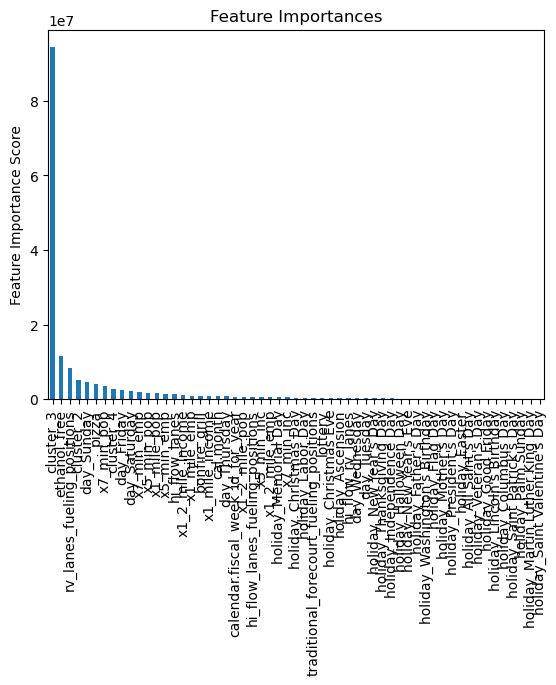

In [26]:
predictors = [x for x in X_train.columns]
target = 'inside_sales'

xgb1 = XGBRegressor(
 learning_rate =0.1,
 n_estimators=1000,
 max_depth=5,
 min_child_weight=1,
 gamma=0,
 subsample=0.8,
 colsample_bytree=0.8,
 objective= 'reg:squarederror',
 nthread=12,
 scale_pos_weight=1,
 seed=1234)
modelfit(xgb1, X_train, y_train, target, predictors)

In [28]:
# Tuning max_depth and min_child_weight
param_test1 = {
 'max_depth':range(8,13,2),
 'min_child_weight':range(10,20,2)
}
gsearch1 = GridSearchCV(estimator = XGBRegressor( learning_rate =0.1, n_estimators=250, max_depth=5,
 min_child_weight=1, gamma=0, subsample=0.8, colsample_bytree=0.8,
 objective= 'reg:squarederror', nthread=8, scale_pos_weight=1, seed=1234), 
 param_grid = param_test1, scoring='neg_mean_absolute_error',n_jobs=8, cv=5)
gsearch1.fit(X_train[predictors],y_train[target])
# display(gsearch1.cv_results_)
print('Best Parmeters: ', gsearch1.best_params_)
print('Best Score: ', gsearch1.best_score_)

Best Parmeters:  {'max_depth': 10, 'min_child_weight': 12}
Best Score:  -205.96088189899984


In [29]:
# Fine-tuning max_depth and min_child_weight
param_test2 = {
 'max_depth':[9,10,11],
 'min_child_weight':[11,12,13]
}
gsearch2 = GridSearchCV(estimator = XGBRegressor( learning_rate =0.1, n_estimators=250, max_depth=5,
 min_child_weight=1, gamma=0, subsample=0.8, colsample_bytree=0.8,
 objective= 'reg:squarederror', nthread=8, scale_pos_weight=1, seed=1234), 
 param_grid = param_test2, scoring='neg_mean_absolute_error',n_jobs=8, cv=5)
gsearch2.fit(X_train[predictors],y_train[target])
# display(gsearch2.cv_results_)
print('Best Parmeters: ', gsearch2.best_params_)
print('Best Score: ', gsearch2.best_score_)

Best Parmeters:  {'max_depth': 9, 'min_child_weight': 13}
Best Score:  -205.81798218358736


In [32]:
# Tuning Gamma
param_test3 = {
    'max_depth':[9],
    'min_child_weight':[13],
#     'gamma':range(1,100,5)
    'gamma':list(np.linspace(56,66,11))
}
gsearch3 = GridSearchCV(estimator = XGBRegressor( learning_rate =0.1, n_estimators=250, max_depth=5,
 min_child_weight=1, gamma=0, subsample=0.8, colsample_bytree=0.8,
 objective= 'reg:squarederror', nthread=8, scale_pos_weight=1, seed=1234), 
 param_grid = param_test3, scoring='neg_mean_absolute_error',n_jobs=8, cv=5)
gsearch3.fit(X_train[predictors],y_train[target])
# display(gsearch3.cv_results_)
print('Best Parmeters: ', gsearch3.best_params_)
print('Best Score: ', gsearch3.best_score_)

Best Parmeters:  {'gamma': 64.0, 'max_depth': 9, 'min_child_weight': 13}
Best Score:  -205.4539023996535


In [35]:
# Tuning subsample and colsample_bytree ratios
param_test4 = {
    'max_depth':[9],
    'min_child_weight':[13],
    'gamma':[64],
#     'subsample':[i/10.0 for i in range(5,10)],
#     'colsample_bytree':[i/10.0 for i in range(5,10)]
    'subsample':[i/100.0 for i in range(80,86)],
    'colsample_bytree':[i/100.0 for i in range(77,83)]
}
gsearch4 = GridSearchCV(estimator = XGBRegressor( learning_rate =0.1, n_estimators=250, max_depth=5,
 min_child_weight=1, gamma=0, subsample=0.8, colsample_bytree=0.8,
 objective= 'reg:squarederror', nthread=8, scale_pos_weight=1, seed=1234), 
 param_grid = param_test4, scoring='neg_mean_absolute_error',n_jobs=-1, cv=5)
gsearch4.fit(X_train[predictors],y_train[target])
# display(gsearch4.cv_results_)
print('Best Parmeters: ', gsearch4.best_params_)
print('Best Score: ', gsearch4.best_score_)

Best Parmeters:  {'colsample_bytree': 0.82, 'gamma': 64, 'max_depth': 9, 'min_child_weight': 13, 'subsample': 0.81}
Best Score:  -205.06602189375218


In [40]:
# Tuning L1 & L2 regularization coefficients (ElastiNet)
param_test5 = {
    'max_depth':[9],
    'min_child_weight':[13],
    'gamma':[64],
    'subsample':[0.81],
    'colsample_bytree':[0.82],
#     'reg_alpha':[1e-5, 1e-4, 1e-3, 1e-2, 0.1],
#     'reg_lambda':[1e-5, 1e-4, 1e-3, 1e-2, 0.1]
    'reg_alpha':list(np.linspace(1e-2,0.1,6)),
    'reg_lambda':list(np.linspace(1e-6,1e-5,6))
}
gsearch5 = GridSearchCV(estimator = XGBRegressor( learning_rate =0.1, n_estimators=250, max_depth=5,
 min_child_weight=1, gamma=0, subsample=0.8, colsample_bytree=0.8,
 objective= 'reg:squarederror', nthread=8, scale_pos_weight=1, seed=1234), 
 param_grid = param_test5, scoring='neg_mean_absolute_error',n_jobs=-1, cv=5)
gsearch5.fit(X_train[predictors],y_train[target])
# display(gsearch5.cv_results_)
print('Best Parmeters: ', gsearch5.best_params_)
print('Best Score: ', gsearch5.best_score_)

Best Parmeters:  {'colsample_bytree': 0.82, 'gamma': 64, 'max_depth': 9, 'min_child_weight': 13, 'reg_alpha': 0.028000000000000004, 'reg_lambda': 2.8000000000000003e-06, 'subsample': 0.81}
Best Score:  -205.6536932116165


In [41]:
param_test6 = {
    'max_depth':[9],
    'min_child_weight':[13],
    'gamma':[64],
    'subsample':[0.81],
    'colsample_bytree':[0.82],
    'reg_alpha':[2.8e-2],
    'reg_lambda':[2.8e-6]
}
gsearch6 = GridSearchCV(estimator = XGBRegressor( learning_rate =0.1, n_estimators=250, max_depth=5,
 min_child_weight=1, gamma=0, subsample=0.8, colsample_bytree=0.8,
 objective= 'reg:squarederror', nthread=8, scale_pos_weight=1, seed=1234), 
 param_grid = param_test6, scoring='neg_mean_absolute_error',n_jobs=8, cv=5)
gsearch6.fit(X_train[predictors],y_train[target])
display(gsearch6.cv_results_)
print('Best Parmeters: ', gsearch6.best_params_)
print('Best Score: ', gsearch6.best_score_)

{'mean_fit_time': array([2.52914376]),
 'std_fit_time': array([0.03107802]),
 'mean_score_time': array([0.009304]),
 'std_score_time': array([0.0007494]),
 'param_colsample_bytree': masked_array(data=[0.82],
              mask=[False],
        fill_value='?',
             dtype=object),
 'param_gamma': masked_array(data=[64],
              mask=[False],
        fill_value='?',
             dtype=object),
 'param_max_depth': masked_array(data=[9],
              mask=[False],
        fill_value='?',
             dtype=object),
 'param_min_child_weight': masked_array(data=[13],
              mask=[False],
        fill_value='?',
             dtype=object),
 'param_reg_alpha': masked_array(data=[0.028],
              mask=[False],
        fill_value='?',
             dtype=object),
 'param_reg_lambda': masked_array(data=[2.8e-06],
              mask=[False],
        fill_value='?',
             dtype=object),
 'param_subsample': masked_array(data=[0.81],
              mask=[False],
       

Best Parmeters:  {'colsample_bytree': 0.82, 'gamma': 64, 'max_depth': 9, 'min_child_weight': 13, 'reg_alpha': 0.028, 'reg_lambda': 2.8e-06, 'subsample': 0.81}
Best Score:  -205.6536932116165


Learning Rate:  0.15

Model Report
MSE : 4.976e+04
MAE : 149.3
MAPE : 2.062e+15
Max Error : 2180


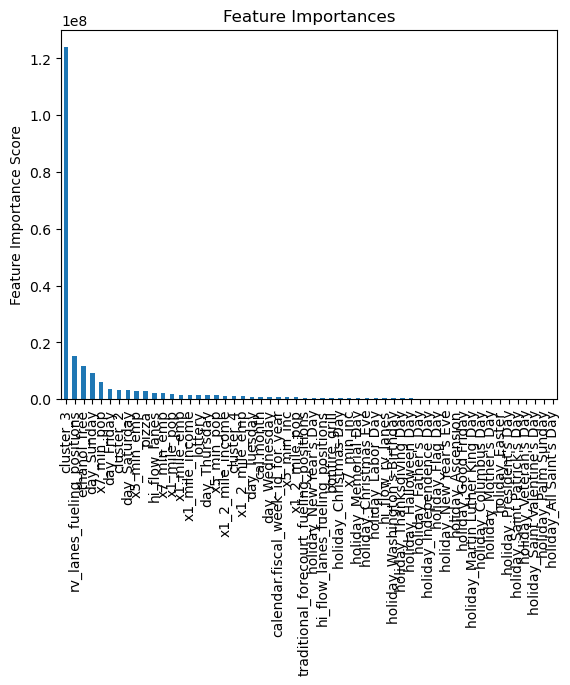


Learning Rate:  0.15625

Model Report
MSE : 4.714e+04
MAE : 144.7
MAPE : 1.796e+15
Max Error : 2193


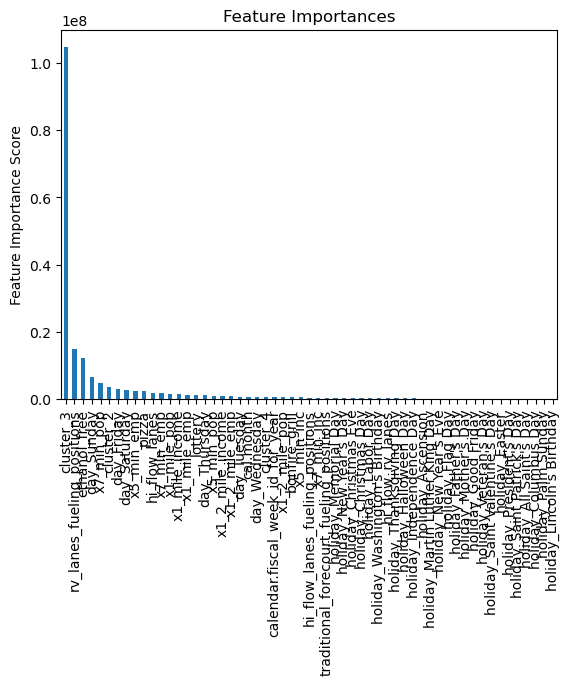


Learning Rate:  0.1625

Model Report
MSE : 4.647e+04
MAE : 143.4
MAPE : 1.778e+15
Max Error : 2146


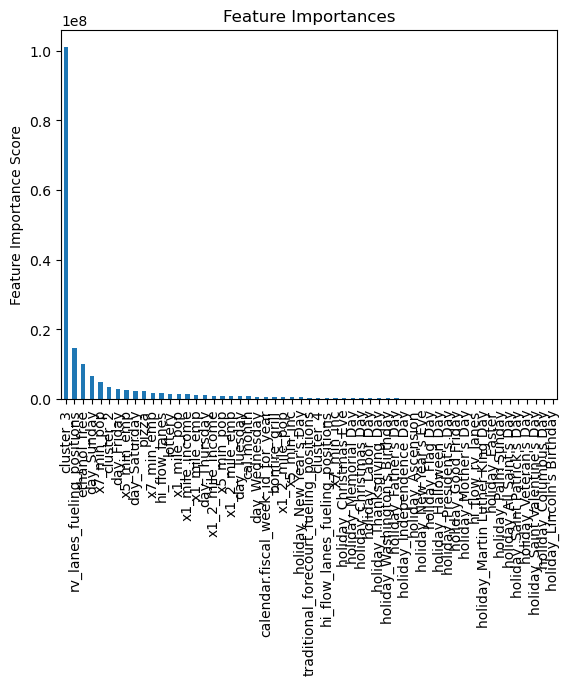


Learning Rate:  0.16875

Model Report
MSE : 4.617e+04
MAE : 143.3
MAPE : 1.432e+15
Max Error : 2165


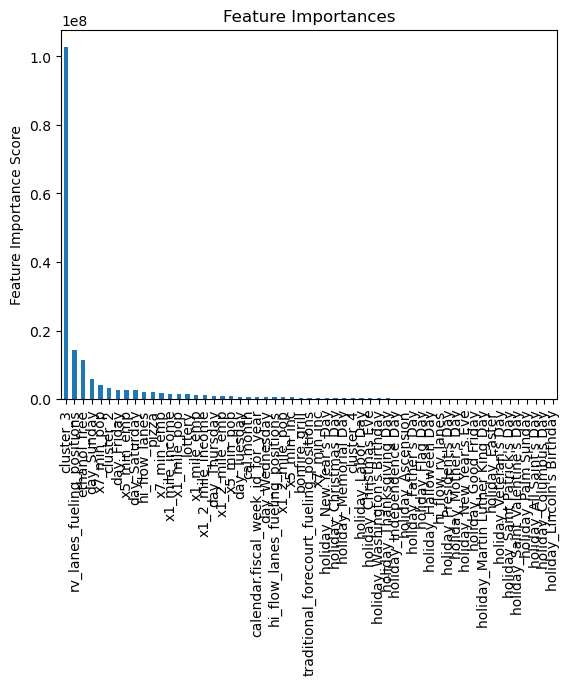


Learning Rate:  0.175

Model Report
MSE : 4.849e+04
MAE : 147.1
MAPE : 2.082e+15
Max Error : 2195


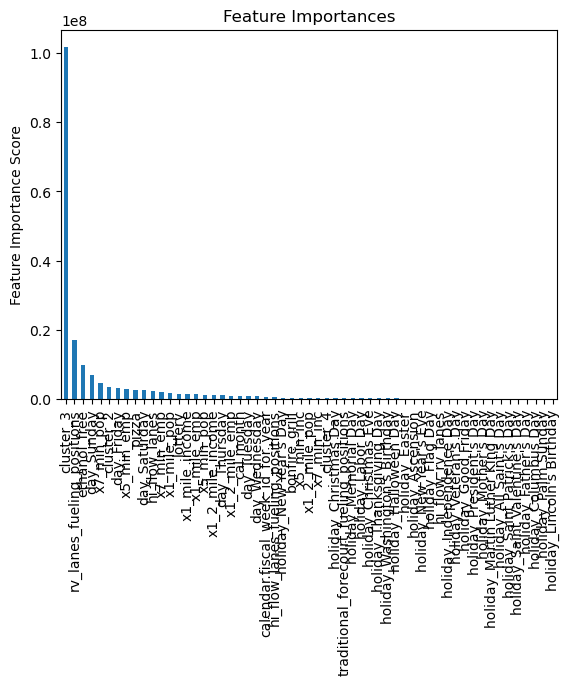


Learning Rate:  0.18125000000000002

Model Report
MSE : 4.983e+04
MAE : 148.8
MAPE : 2.137e+15
Max Error : 2258


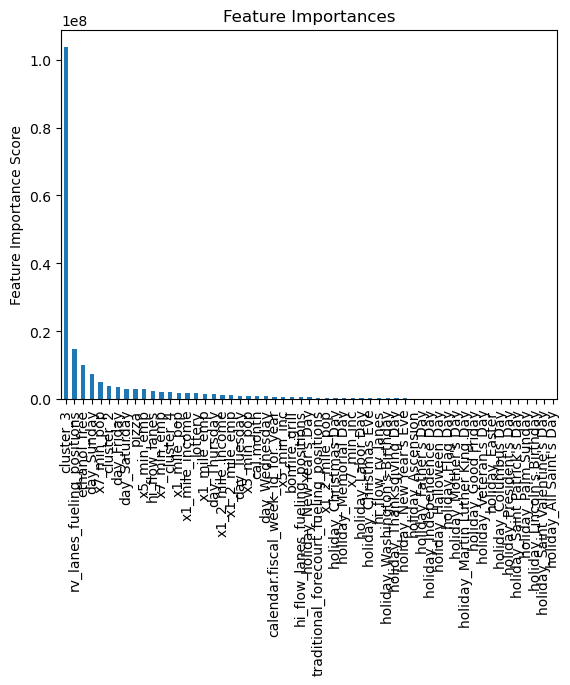


Learning Rate:  0.1875

Model Report
MSE : 4.957e+04
MAE : 149.1
MAPE : 2.082e+15
Max Error : 2093


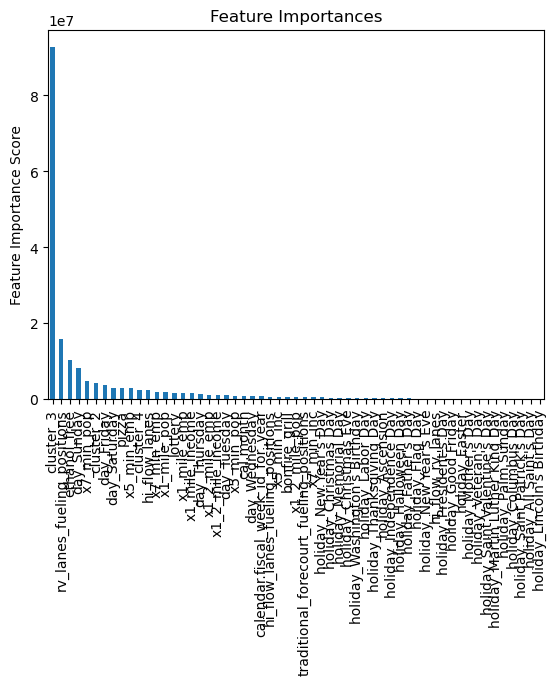


Learning Rate:  0.19375

Model Report
MSE : 5.021e+04
MAE : 150
MAPE : 2.067e+15
Max Error : 2207


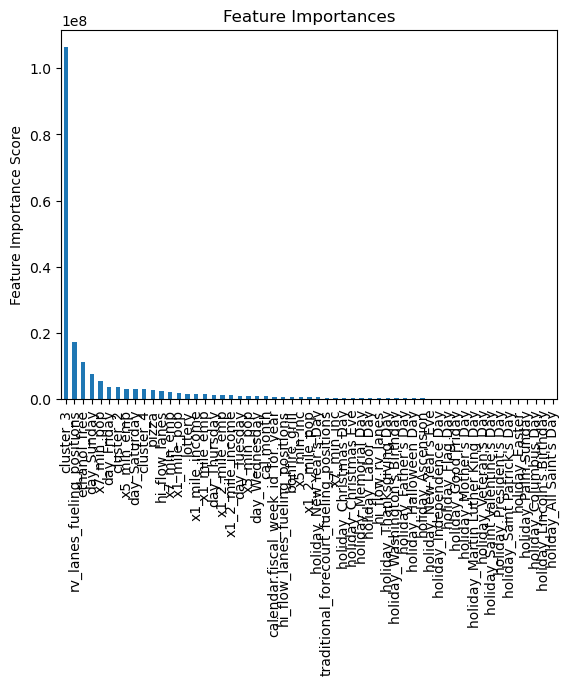


Learning Rate:  0.2

Model Report
MSE : 4.832e+04
MAE : 146.6
MAPE : 2.027e+15
Max Error : 2159


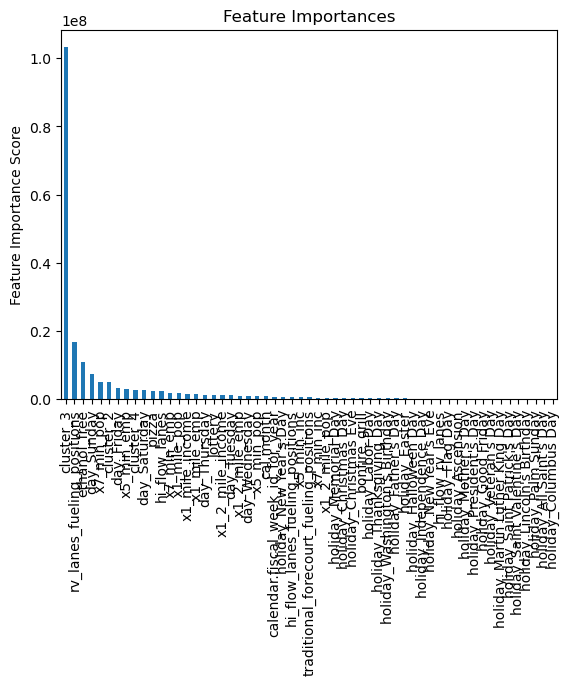

In [44]:
predictors = [x for x in X_train.columns]
target = 'inside_sales'
# learning_rates = [1e-4, 1e-3, 1e-2, 0.1, 0.25, 0.5]
learning_rates = list(np.linspace(0.15,0.2,9))

for lr in learning_rates:
    print('Learning Rate: ', lr)
    xgb3 = XGBRegressor(learning_rate =lr,
                         n_estimators=10000,
                         max_depth=9,
                         min_child_weight=13,
                         gamma=64,
                         subsample=0.81,
                         colsample_bytree=0.82,
                         reg_alpha=0.028,
                         reg_lambda=2.8e-6,
                         objective= 'reg:squarederror',
                         nthread=12,
                         scale_pos_weight=1,
                         seed=1234)
    modelfit(xgb3, X_train, y_train, target, predictors)

# Food Service Training


Model Report
MSE : 3994
MAE : 44.96
MAPE : 4.031e+14
Max Error : 646.8


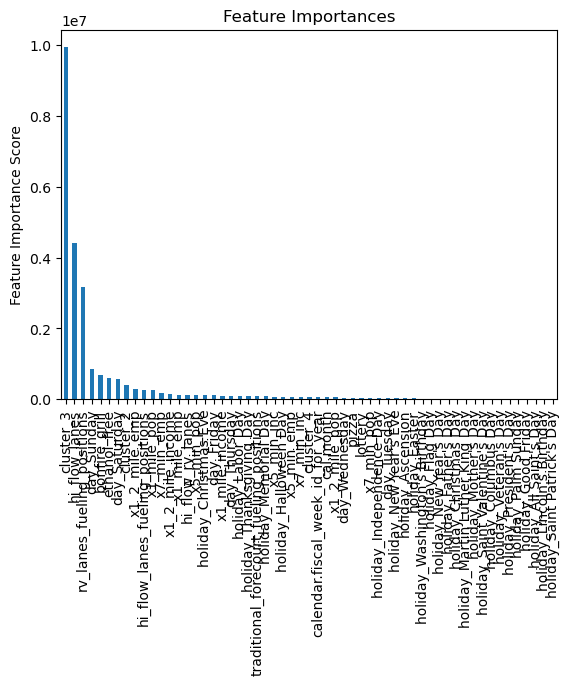

In [11]:
predictors = [x for x in X_train.columns]
target = 'food_service'

xgb3 = XGBRegressor(
 learning_rate =0.1,
 n_estimators=1000,
 max_depth=5,
 min_child_weight=1,
 gamma=0,
 subsample=0.8,
 colsample_bytree=0.8,
 objective= 'reg:squarederror',
 nthread=12,
 scale_pos_weight=1,
 seed=1234)
modelfit(xgb3, X_train, y_train, target, predictors)

In [12]:
# Tuning max_depth and min_child_weight
param_test1 = {
 'max_depth':range(7,15,2),
 'min_child_weight':range(2,13,2)
}
gsearch1 = GridSearchCV(estimator = XGBRegressor( learning_rate =0.1, n_estimators=250, max_depth=5,
 min_child_weight=1, gamma=0, subsample=0.8, colsample_bytree=0.8,
 objective= 'reg:squarederror', nthread=8, scale_pos_weight=1, seed=1234), 
 param_grid = param_test1, scoring='neg_mean_absolute_error',n_jobs=8, cv=5)
gsearch1.fit(X_train[predictors],y_train[target])
# display(gsearch1.cv_results_)
print('Best Parmeters: ', gsearch1.best_params_)
print('Best Score: ', gsearch1.best_score_)

Best Parmeters:  {'max_depth': 9, 'min_child_weight': 10}
Best Score:  -62.98409303401495


In [13]:
# Fine-tuning max_depth and min_child_weight
param_test2 = {
 'max_depth':[8,9,10],
 'min_child_weight':[9,10,11]
}
gsearch2 = GridSearchCV(estimator = XGBRegressor( learning_rate =0.1, n_estimators=250, max_depth=5,
 min_child_weight=1, gamma=0, subsample=0.8, colsample_bytree=0.8,
 objective= 'reg:squarederror', nthread=8, scale_pos_weight=1, seed=1234), 
 param_grid = param_test2, scoring='neg_mean_absolute_error',n_jobs=8, cv=5)
gsearch2.fit(X_train[predictors],y_train[target])
# display(gsearch2.cv_results_)
print('Best Parmeters: ', gsearch2.best_params_)
print('Best Score: ', gsearch2.best_score_)

Best Parmeters:  {'max_depth': 10, 'min_child_weight': 11}
Best Score:  -62.828178804626205


In [16]:
# Tuning Gamma
param_test3 = {
    'max_depth':[10],
    'min_child_weight':[11],
#     'gamma':range(2,100,10)
    'gamma':list(np.linspace(55,61,7))
}
gsearch3 = GridSearchCV(estimator = XGBRegressor( learning_rate =0.1, n_estimators=250, max_depth=5,
 min_child_weight=1, gamma=0, subsample=0.8, colsample_bytree=0.8,
 objective= 'reg:squarederror', nthread=8, scale_pos_weight=1, seed=1234), 
 param_grid = param_test3, scoring='neg_mean_absolute_error',n_jobs=8, cv=5)
gsearch3.fit(X_train[predictors],y_train[target])
# display(gsearch3.cv_results_)
print('Best Parmeters: ', gsearch3.best_params_)
print('Best Score: ', gsearch3.best_score_)

Best Parmeters:  {'gamma': 58.0, 'max_depth': 10, 'min_child_weight': 11}
Best Score:  -62.766027339692904


In [19]:
# Tuning subsample and colsample_bytree ratios
param_test4 = {
    'max_depth':[10],
    'min_child_weight':[11],
    'gamma':[58],
#     'subsample':[i/10.0 for i in range(5,10)],
#     'colsample_bytree':[i/10.0 for i in range(5,10)]
    'subsample':[i/100.0 for i in range(77,83)],
    'colsample_bytree':[i/100.0 for i in range(77,83)]
}
gsearch4 = GridSearchCV(estimator = XGBRegressor( learning_rate =0.1, n_estimators=250, max_depth=5,
 min_child_weight=1, gamma=0, subsample=0.8, colsample_bytree=0.8,
 objective= 'reg:squarederror', nthread=8, scale_pos_weight=1, seed=1234), 
 param_grid = param_test4, scoring='neg_mean_absolute_error',n_jobs=-1, cv=5)
gsearch4.fit(X_train[predictors],y_train[target])
# display(gsearch4.cv_results_)
print('Best Parmeters: ', gsearch4.best_params_)
print('Best Score: ', gsearch4.best_score_)

Best Parmeters:  {'colsample_bytree': 0.8, 'gamma': 58, 'max_depth': 10, 'min_child_weight': 11, 'subsample': 0.8}
Best Score:  -62.766027339692904


In [23]:
# Tuning L1 & L2 regularization coefficients (ElastiNet)
param_test5 = {
    'max_depth':[10],
    'min_child_weight':[11],
    'gamma':[58],
    'subsample':[0.8],
    'colsample_bytree':[0.8],
#     'reg_alpha':[1e-2, 0.1, 0.25, 0.5],
#     'reg_lambda':[1e-2, 0.1, 0.25, 0.5]
    'reg_alpha':list(np.linspace(0.02,.07,6)),
    'reg_lambda':list(np.linspace(0.5,0.75,6))
}
gsearch5 = GridSearchCV(estimator = XGBRegressor( learning_rate =0.1, n_estimators=250, max_depth=5,
 min_child_weight=1, gamma=0, subsample=0.8, colsample_bytree=0.8,
 objective= 'reg:squarederror', nthread=8, scale_pos_weight=1, seed=1234), 
 param_grid = param_test5, scoring='neg_mean_absolute_error',n_jobs=8, cv=5)
gsearch5.fit(X_train[predictors],y_train[target])
# display(gsearch5.cv_results_)
print('Best Parmeters: ', gsearch5.best_params_)
print('Best Score: ', gsearch5.best_score_)

Best Parmeters:  {'colsample_bytree': 0.8, 'gamma': 58, 'max_depth': 10, 'min_child_weight': 11, 'reg_alpha': 0.06, 'reg_lambda': 0.65, 'subsample': 0.8}
Best Score:  -62.57301331018241


In [24]:
param_test6 = {
    'max_depth':[10],
    'min_child_weight':[11],
    'gamma':[58],
    'subsample':[0.8],
    'colsample_bytree':[0.8],
    'reg_alpha':[6e-2],
    'reg_lambda':[6.5e-1]
}
gsearch6 = GridSearchCV(estimator = XGBRegressor( learning_rate =0.1, n_estimators=250, max_depth=5,
 min_child_weight=1, gamma=0, subsample=0.8, colsample_bytree=0.8,
 objective= 'reg:squarederror', nthread=8, scale_pos_weight=1, seed=1234), 
 param_grid = param_test6, scoring='neg_mean_absolute_error',n_jobs=8, cv=5)
gsearch6.fit(X_train[predictors],y_train[target])
display(gsearch6.cv_results_)
print('Best Parmeters: ', gsearch6.best_params_)
print('Best Score: ', gsearch6.best_score_)

{'mean_fit_time': array([2.60369825]),
 'std_fit_time': array([0.0273308]),
 'mean_score_time': array([0.00800886]),
 'std_score_time': array([0.00095304]),
 'param_colsample_bytree': masked_array(data=[0.8],
              mask=[False],
        fill_value='?',
             dtype=object),
 'param_gamma': masked_array(data=[58],
              mask=[False],
        fill_value='?',
             dtype=object),
 'param_max_depth': masked_array(data=[10],
              mask=[False],
        fill_value='?',
             dtype=object),
 'param_min_child_weight': masked_array(data=[11],
              mask=[False],
        fill_value='?',
             dtype=object),
 'param_reg_alpha': masked_array(data=[0.06],
              mask=[False],
        fill_value='?',
             dtype=object),
 'param_reg_lambda': masked_array(data=[0.65],
              mask=[False],
        fill_value='?',
             dtype=object),
 'param_subsample': masked_array(data=[0.8],
              mask=[False],
        fi

Best Parmeters:  {'colsample_bytree': 0.8, 'gamma': 58, 'max_depth': 10, 'min_child_weight': 11, 'reg_alpha': 0.06, 'reg_lambda': 0.65, 'subsample': 0.8}
Best Score:  -62.57301331018241


Learning Rate:  0.005

Model Report
MSE : 4416
MAE : 45.79
MAPE : 6.287e+14
Max Error : 641.2


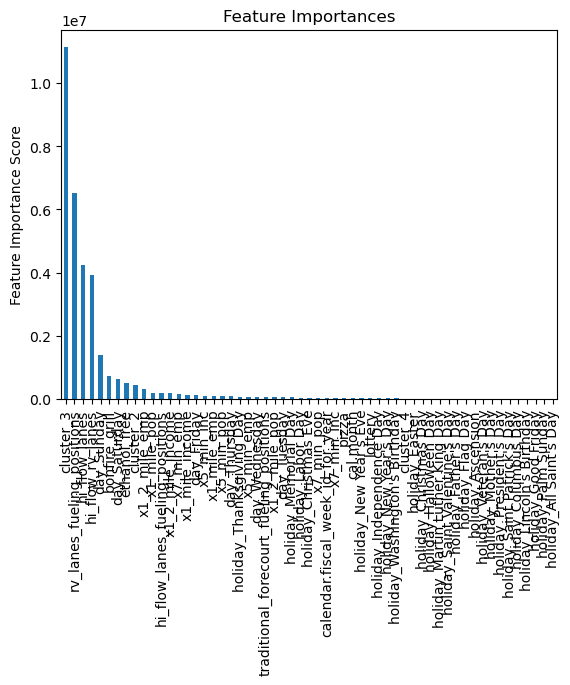


Learning Rate:  0.008166666666666666

Model Report
MSE : 4407
MAE : 45.76
MAPE : 6.208e+14
Max Error : 651.2


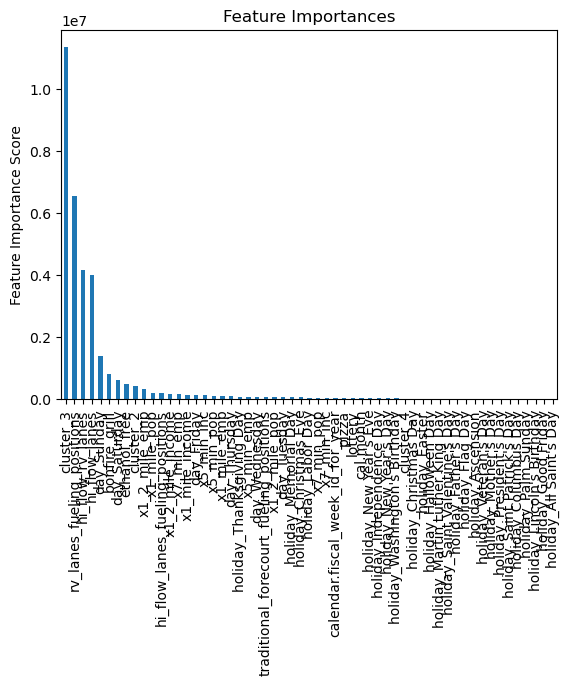


Learning Rate:  0.011333333333333334

Model Report
MSE : 4585
MAE : 46.67
MAPE : 6.731e+14
Max Error : 655.2


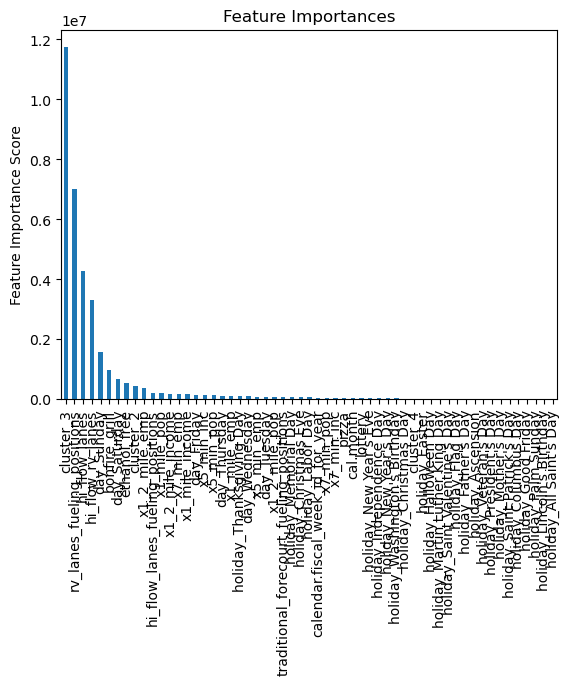


Learning Rate:  0.014499999999999999

Model Report
MSE : 4290
MAE : 45.2
MAPE : 5.98e+14
Max Error : 624


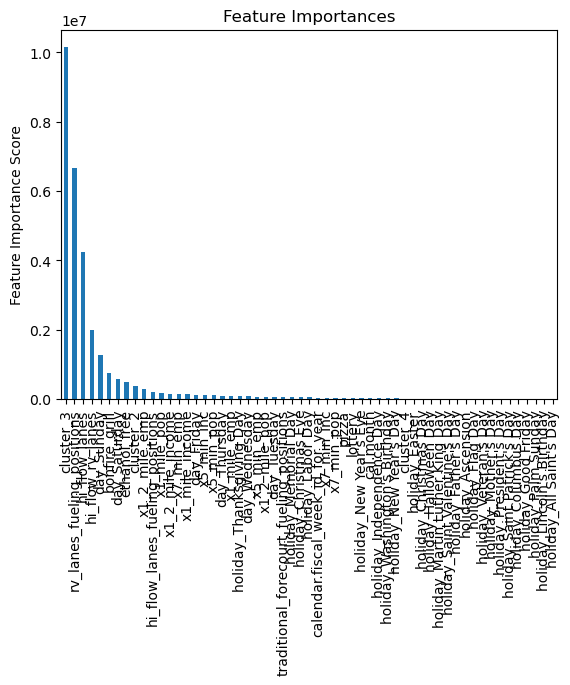


Learning Rate:  0.017666666666666667

Model Report
MSE : 4242
MAE : 44.96
MAPE : 5.888e+14
Max Error : 624.5


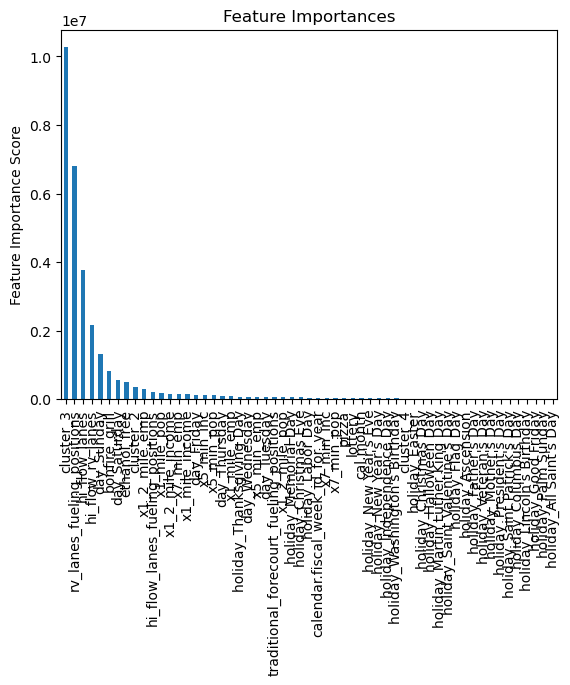


Learning Rate:  0.020833333333333332

Model Report
MSE : 4334
MAE : 45.42
MAPE : 5.969e+14
Max Error : 622.5


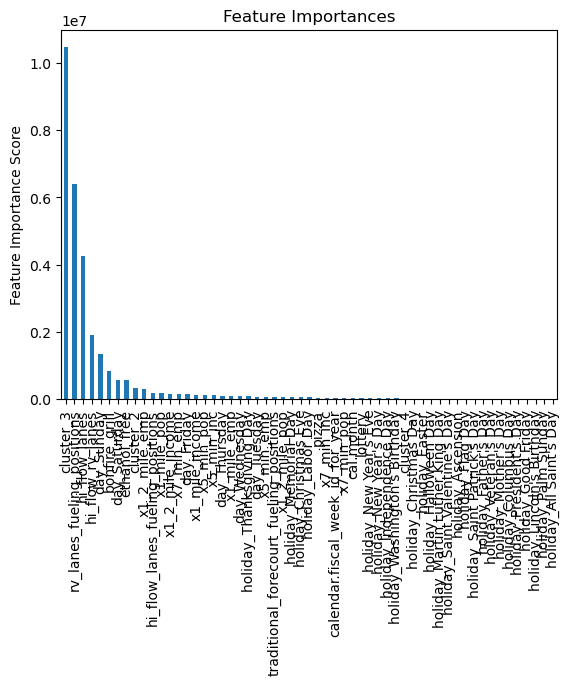


Learning Rate:  0.024

Model Report
MSE : 4476
MAE : 46.23
MAPE : 6.121e+14
Max Error : 635.8


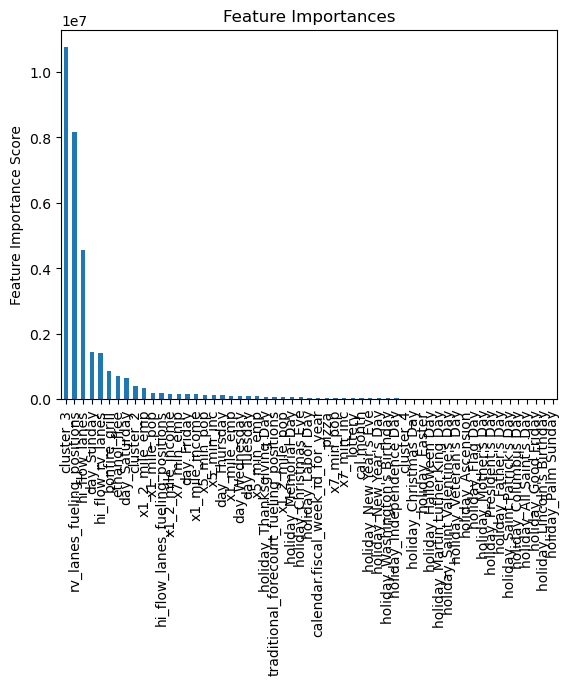


Learning Rate:  0.02716666666666667

Model Report
MSE : 4480
MAE : 46.28
MAPE : 6.326e+14
Max Error : 633.5


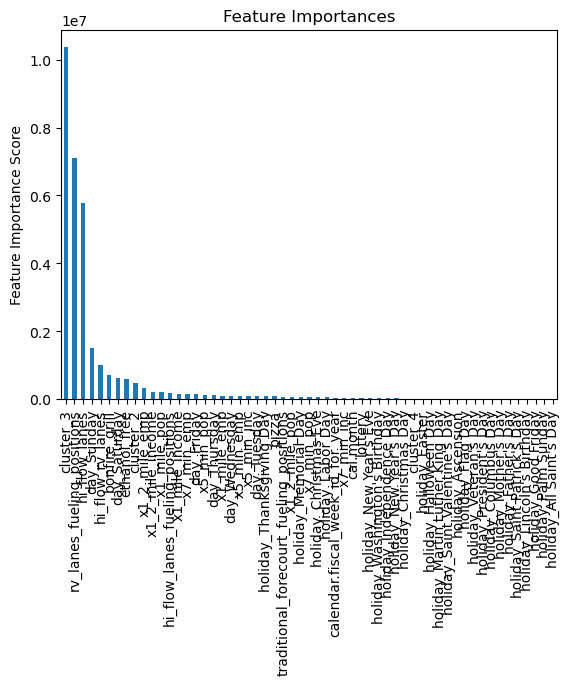


Learning Rate:  0.030333333333333334

Model Report
MSE : 4401
MAE : 45.84
MAPE : 6.207e+14
Max Error : 634.4


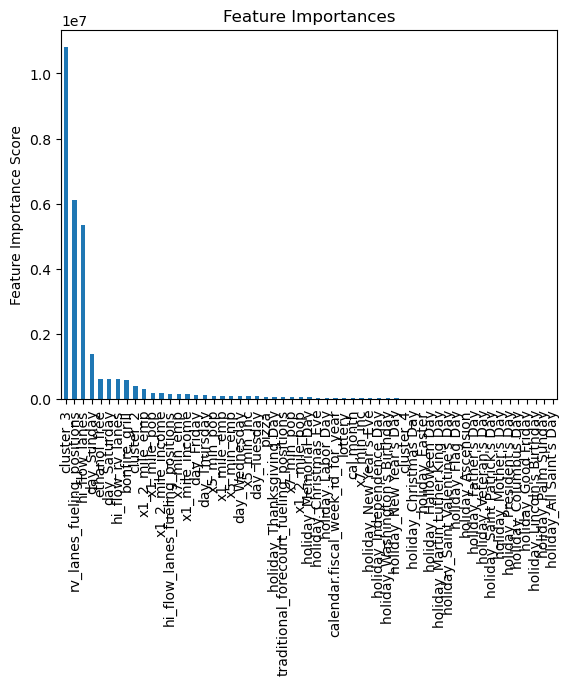


Learning Rate:  0.033499999999999995

Model Report
MSE : 4529
MAE : 46.49
MAPE : 6.23e+14
Max Error : 642


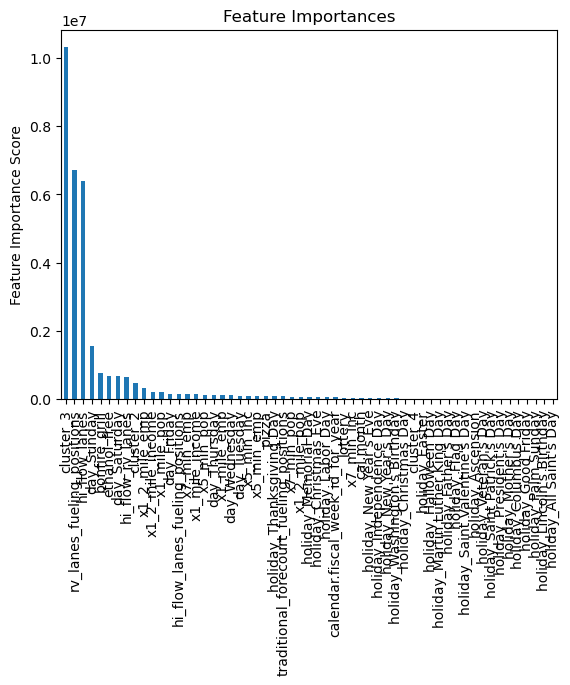


Learning Rate:  0.03666666666666666

Model Report
MSE : 4351
MAE : 45.57
MAPE : 5.795e+14
Max Error : 634.5


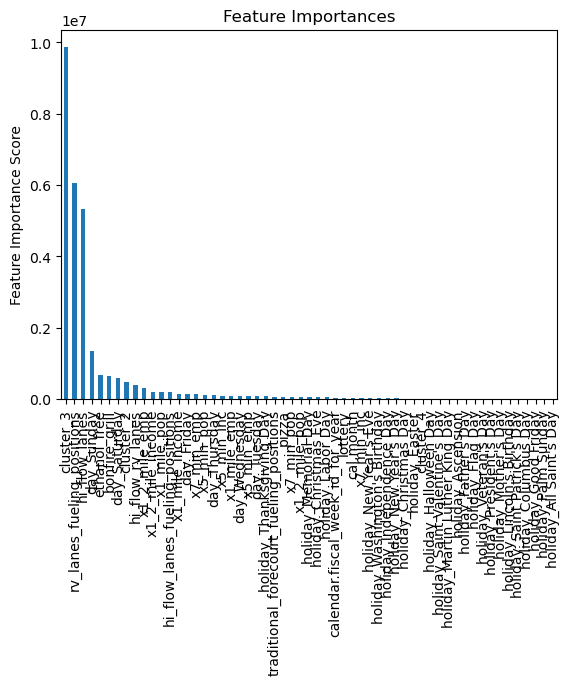


Learning Rate:  0.03983333333333333

Model Report
MSE : 4289
MAE : 45.23
MAPE : 5.765e+14
Max Error : 632


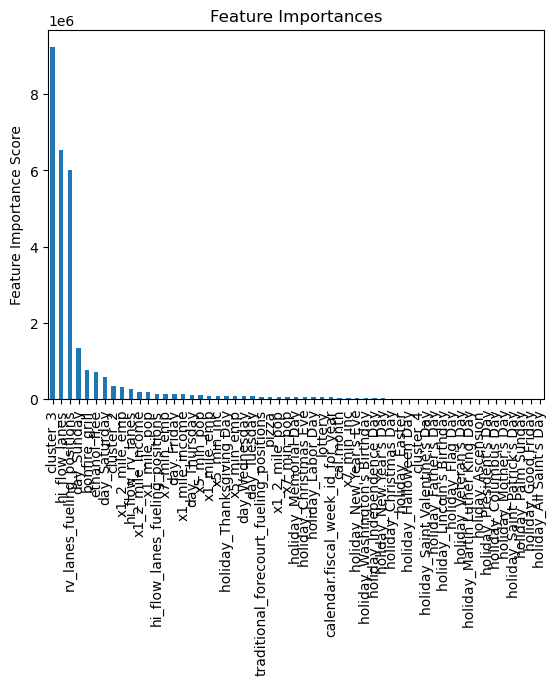


Learning Rate:  0.043

Model Report
MSE : 4440
MAE : 46
MAPE : 6.233e+14
Max Error : 631.3


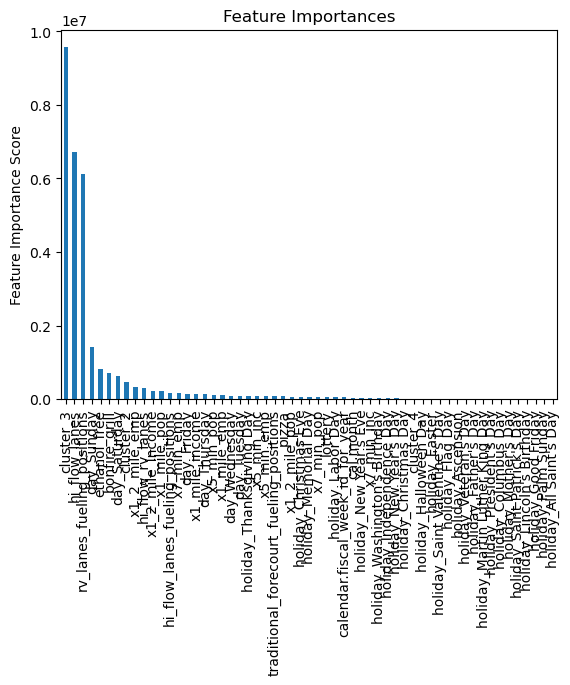


Learning Rate:  0.04616666666666666

Model Report
MSE : 4417
MAE : 45.93
MAPE : 5.648e+14
Max Error : 601.6


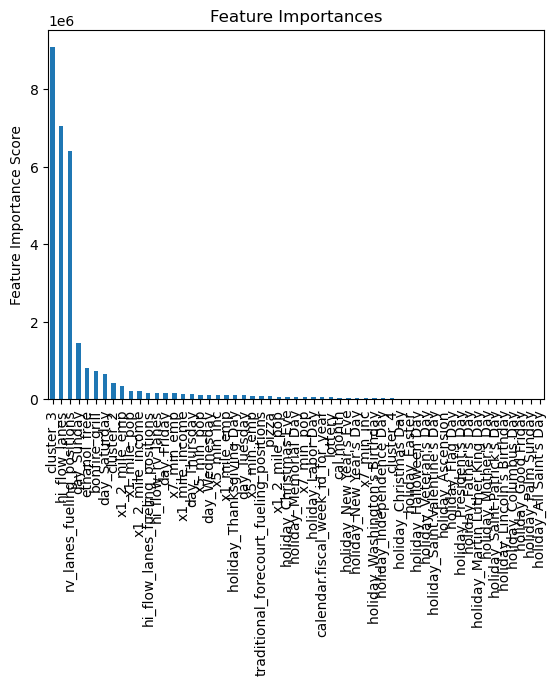


Learning Rate:  0.04933333333333333

Model Report
MSE : 4294
MAE : 45.27
MAPE : 5.454e+14
Max Error : 607.9


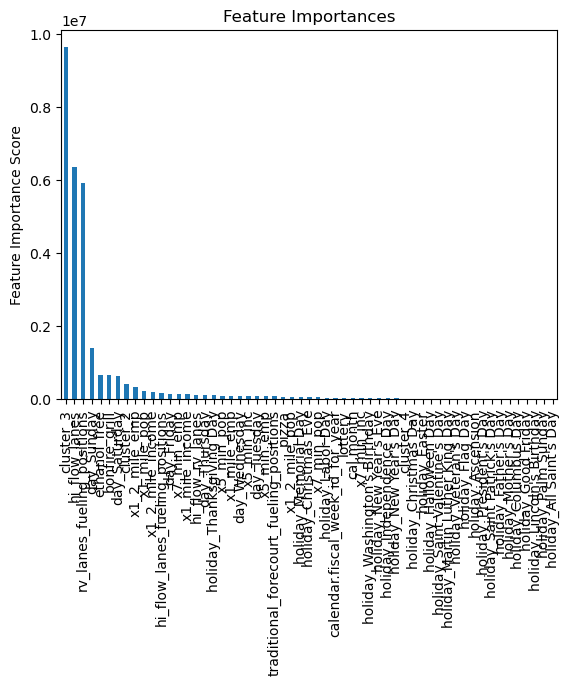


Learning Rate:  0.0525

Model Report
MSE : 4181
MAE : 44.71
MAPE : 5.583e+14
Max Error : 602.5


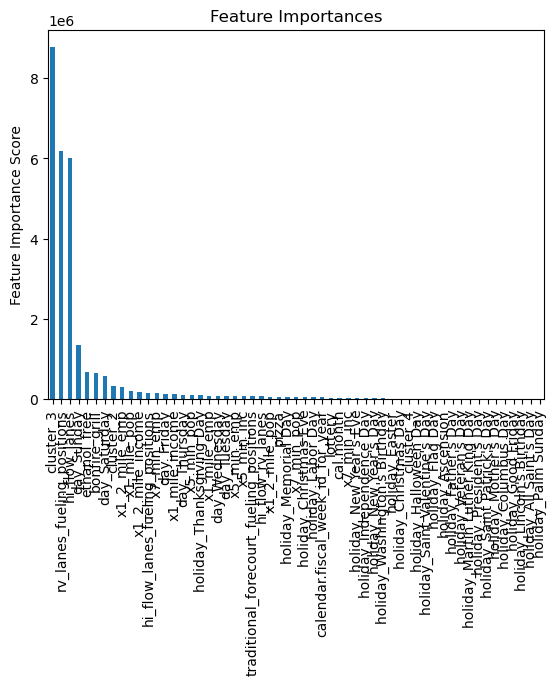


Learning Rate:  0.05566666666666666

Model Report
MSE : 4229
MAE : 44.92
MAPE : 5.675e+14
Max Error : 604.6


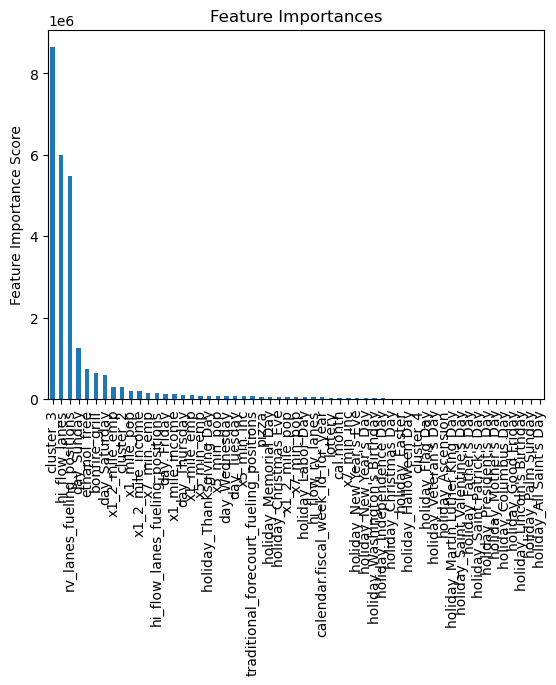


Learning Rate:  0.05883333333333333

Model Report
MSE : 4313
MAE : 45.36
MAPE : 5.64e+14
Max Error : 626.4


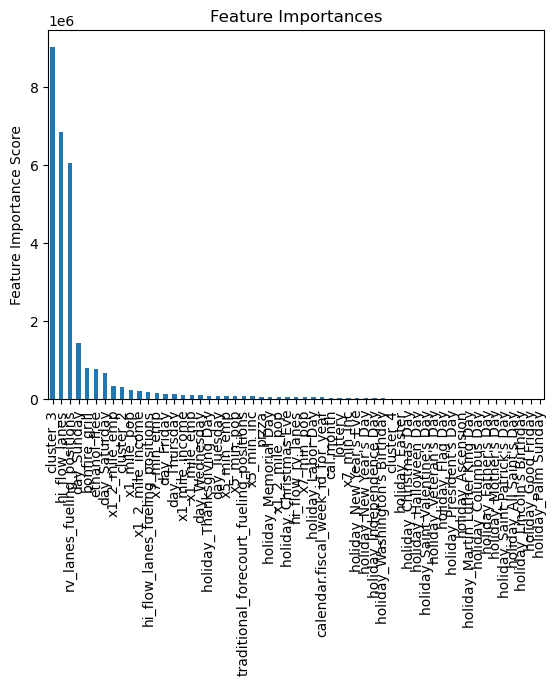


Learning Rate:  0.06199999999999999

Model Report
MSE : 4173
MAE : 44.69
MAPE : 5.574e+14
Max Error : 602.9


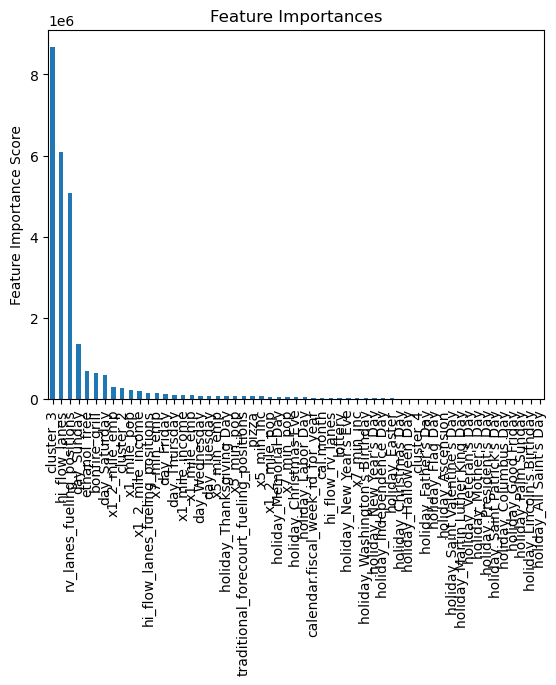


Learning Rate:  0.06516666666666666

Model Report
MSE : 4364
MAE : 45.68
MAPE : 5.288e+14
Max Error : 613.3


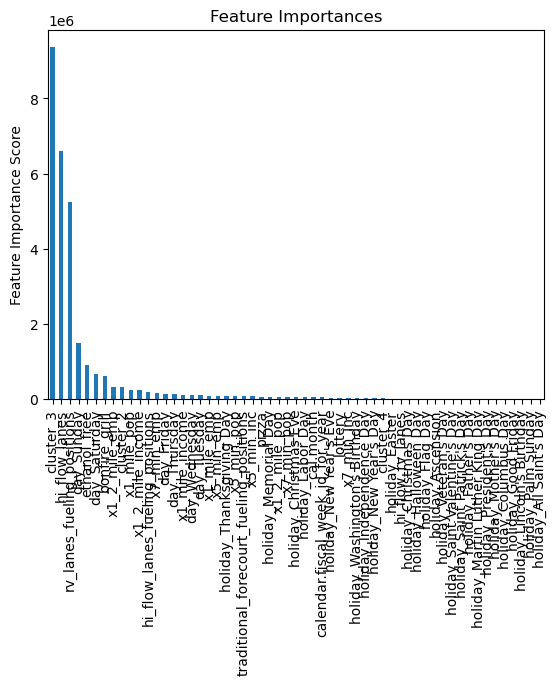


Learning Rate:  0.06833333333333333

Model Report
MSE : 4339
MAE : 45.69
MAPE : 5.015e+14
Max Error : 630.7


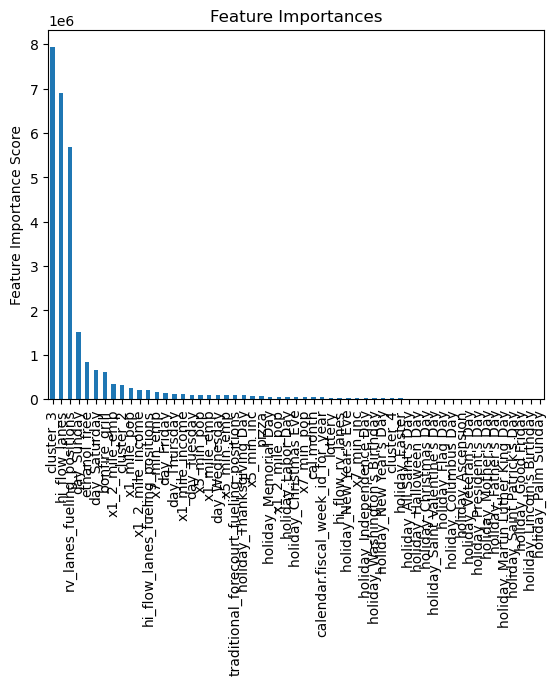


Learning Rate:  0.07150000000000001

Model Report
MSE : 4254
MAE : 45.18
MAPE : 5.169e+14
Max Error : 616.2


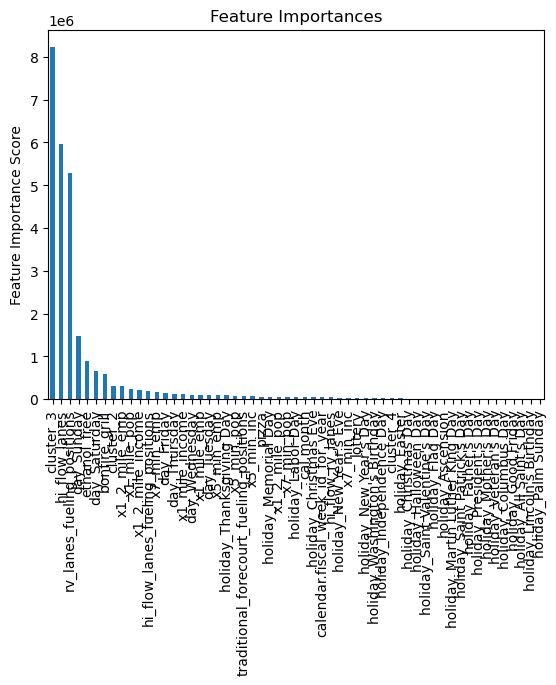


Learning Rate:  0.07466666666666667

Model Report
MSE : 4227
MAE : 45.04
MAPE : 5.484e+14
Max Error : 621.7


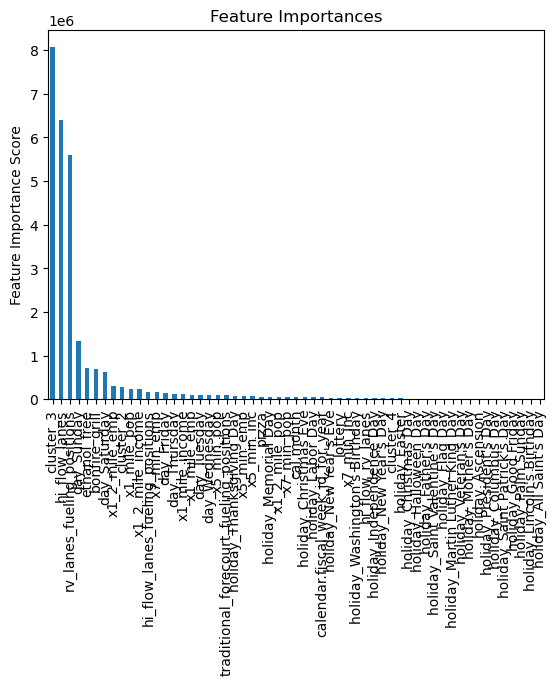


Learning Rate:  0.07783333333333334

Model Report
MSE : 4669
MAE : 47.29
MAPE : 7.056e+14
Max Error : 646.9


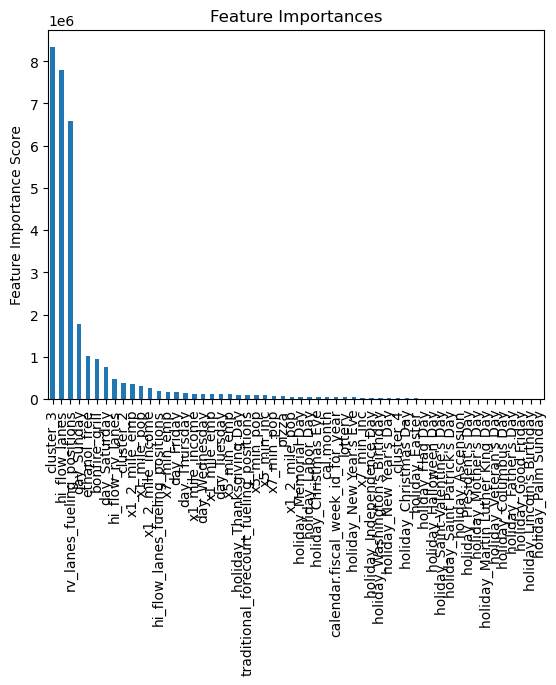


Learning Rate:  0.081

Model Report
MSE : 4313
MAE : 45.58
MAPE : 5.256e+14
Max Error : 631.6


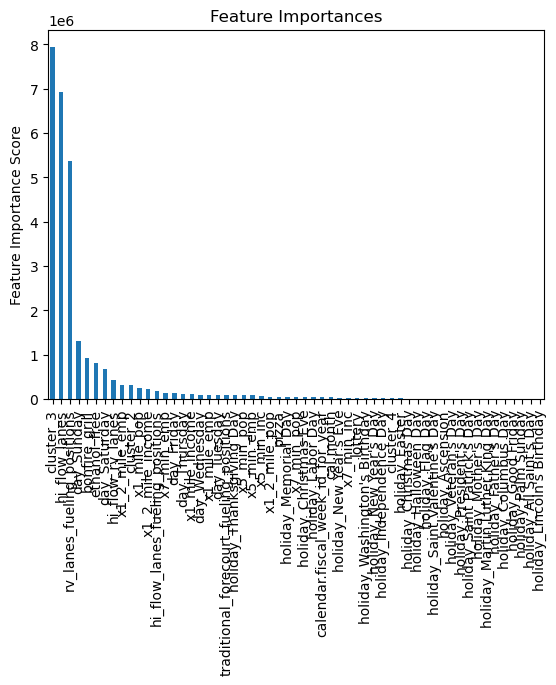


Learning Rate:  0.08416666666666667

Model Report
MSE : 4621
MAE : 47.1
MAPE : 6.686e+14
Max Error : 658


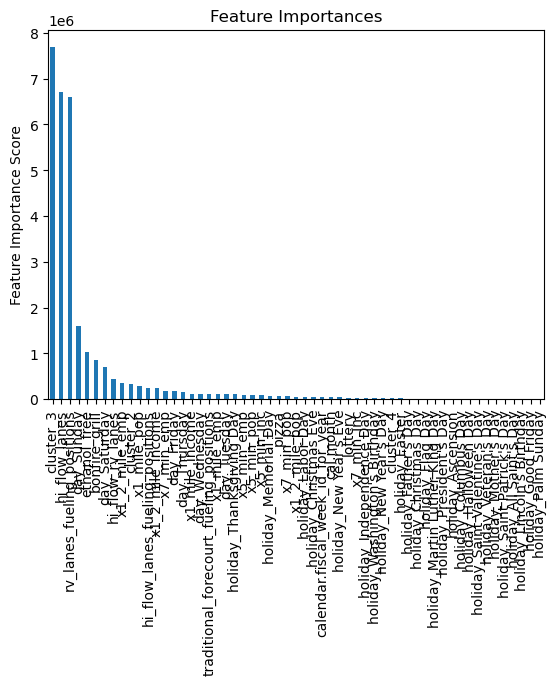


Learning Rate:  0.08733333333333333

Model Report
MSE : 4277
MAE : 45.41
MAPE : 5.362e+14
Max Error : 638.4


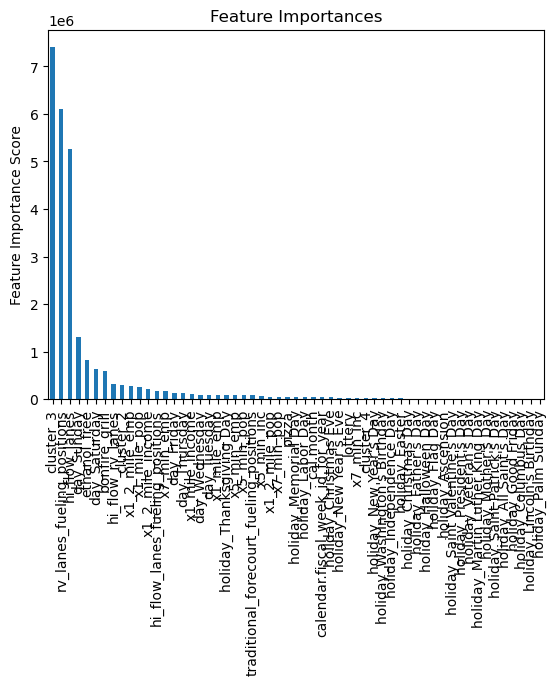


Learning Rate:  0.0905

Model Report
MSE : 4525
MAE : 46.74
MAPE : 6.721e+14
Max Error : 621.8


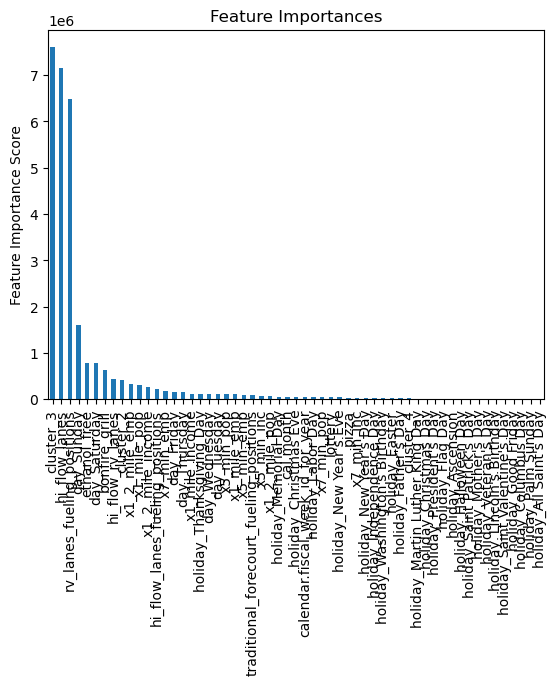


Learning Rate:  0.09366666666666668

Model Report
MSE : 4429
MAE : 46.23
MAPE : 6.423e+14
Max Error : 606.7


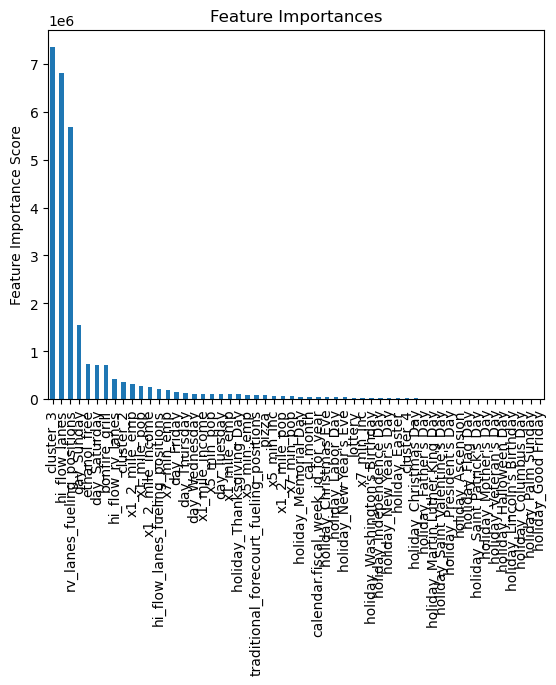


Learning Rate:  0.09683333333333334

Model Report
MSE : 4322
MAE : 45.68
MAPE : 5.867e+14
Max Error : 611.8


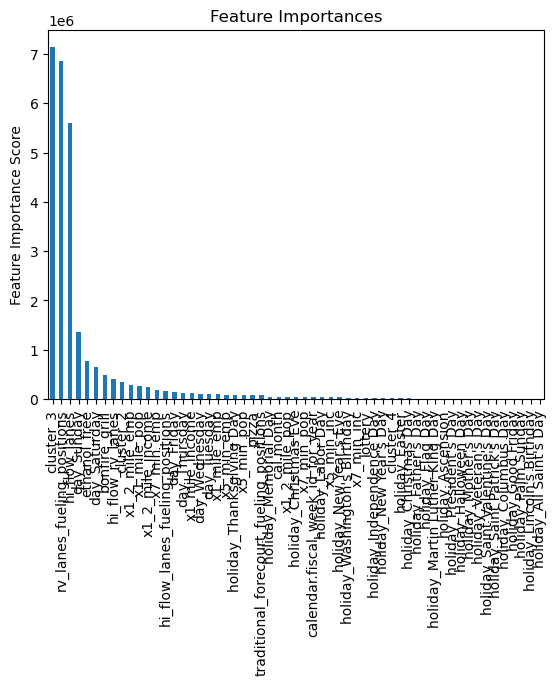


Learning Rate:  0.1

Model Report
MSE : 4394
MAE : 46.06
MAPE : 6.276e+14
Max Error : 610.6


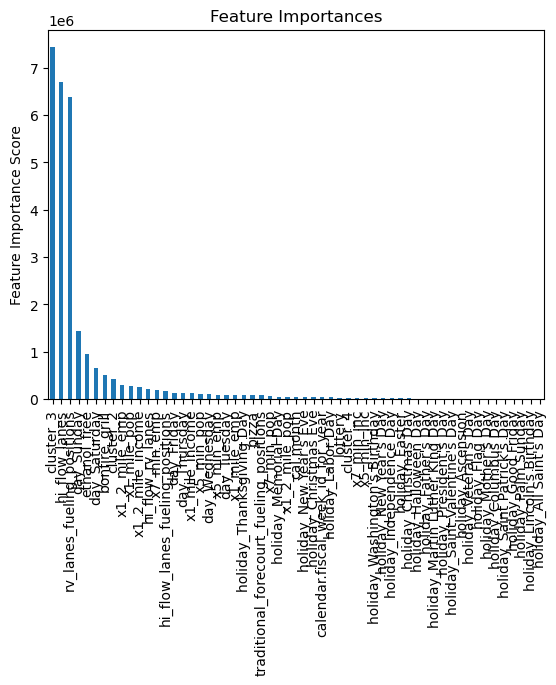

In [27]:
predictors = [x for x in X_train.columns]
target = 'food_service'
# learning_rates = [1e-3, 1e-2, 0.1, 0.25, 0.5]
learning_rates = list(np.linspace(0.005,0.1,31))

for lr in learning_rates:
    print('Learning Rate: ', lr)
    xgb4 = XGBRegressor(learning_rate =lr,
                         n_estimators=10000,
                         max_depth=10,
                         min_child_weight=11,
                         gamma=58,
                         subsample=0.8,
                         colsample_bytree=0.8,
                         reg_alpha=6e-2,
                         reg_lambda=0.65,
                         objective= 'reg:squarederror',
                         nthread=12,
                         scale_pos_weight=1,
                         seed=1234)
    modelfit(xgb4, X_train, y_train, target, predictors)

# Diesel Training


Model Report
MSE : 5.458e+04
MAE : 150.3
MAPE : 0.1612
Max Error : 2717


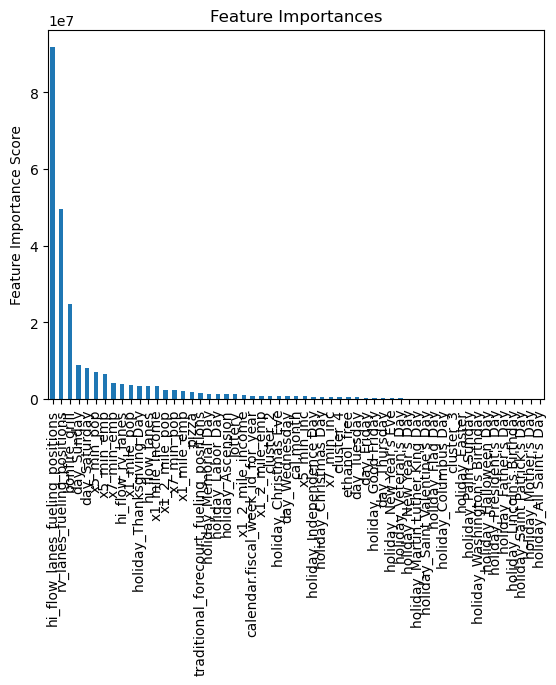

In [29]:
predictors = [x for x in X_train.columns]
target = 'diesel_x'

xgb5 = XGBRegressor(
 learning_rate =0.1,
 n_estimators=1000,
 max_depth=5,
 min_child_weight=1,
 gamma=0,
 subsample=0.8,
 colsample_bytree=0.8,
 objective= 'reg:squarederror',
 nthread=12,
 scale_pos_weight=1,
 seed=1234)
modelfit(xgb5, X_train, y_train, target, predictors)

In [32]:
# Tuning max_depth and min_child_weight
param_test1 = {
 'max_depth':range(2,15,2),
 'min_child_weight':range(2,13,2)
}
gsearch1 = GridSearchCV(estimator = XGBRegressor( learning_rate =0.1, n_estimators=250, max_depth=5,
 min_child_weight=1, gamma=0, subsample=0.8, colsample_bytree=0.8,
 objective= 'reg:squarederror', nthread=8, scale_pos_weight=1, seed=1234), 
 param_grid = param_test1, scoring='neg_mean_absolute_error',n_jobs=8, cv=5)
gsearch1.fit(X_train[predictors],y_train[target])
# display(gsearch1.cv_results_)
print('Best Parmeters: ', gsearch1.best_params_)
print('Best Score: ', gsearch1.best_score_)

Best Parmeters:  {'max_depth': 10, 'min_child_weight': 8}
Best Score:  -204.22548947078184


In [33]:
# Fine-tuning max_depth and min_child_weight
param_test2 = {
 'max_depth':[9,10,11],
 'min_child_weight':[7,8,9]
}
gsearch2 = GridSearchCV(estimator = XGBRegressor( learning_rate =0.1, n_estimators=250, max_depth=5,
 min_child_weight=1, gamma=0, subsample=0.8, colsample_bytree=0.8,
 objective= 'reg:squarederror', nthread=8, scale_pos_weight=1, seed=1234), 
 param_grid = param_test2, scoring='neg_mean_absolute_error',n_jobs=8, cv=5)
gsearch2.fit(X_train[predictors],y_train[target])
# display(gsearch2.cv_results_)
print('Best Parmeters: ', gsearch2.best_params_)
print('Best Score: ', gsearch2.best_score_)

Best Parmeters:  {'max_depth': 9, 'min_child_weight': 7}
Best Score:  -203.79371513210782


In [35]:
# Tuning Gamma
param_test3 = {
    'max_depth':[9],
    'min_child_weight':[7],
#     'gamma':range(1,100,5)
    'gamma':list(np.linspace(26,36,11))
}
gsearch3 = GridSearchCV(estimator = XGBRegressor( learning_rate =0.1, n_estimators=250, max_depth=5,
 min_child_weight=1, gamma=0, subsample=0.8, colsample_bytree=0.8,
 objective= 'reg:squarederror', nthread=8, scale_pos_weight=1, seed=1234), 
 param_grid = param_test3, scoring='neg_mean_absolute_error',n_jobs=8, cv=5)
gsearch3.fit(X_train[predictors],y_train[target])
# display(gsearch3.cv_results_)
print('Best Parmeters: ', gsearch3.best_params_)
print('Best Score: ', gsearch3.best_score_)

Best Parmeters:  {'gamma': 31.0, 'max_depth': 9, 'min_child_weight': 7}
Best Score:  -203.93270040580825


In [39]:
# Tuning subsample and colsample_bytree ratios
param_test4 = {
    'max_depth':[9],
    'min_child_weight':[7],
    'gamma':[31],
#     'subsample':[i/10.0 for i in range(5,10)],
#     'colsample_bytree':[i/10.0 for i in range(5,10)]
    'subsample':[i/100.0 for i in range(83,89)],
    'colsample_bytree':[i/100.0 for i in range(83,89)]
}
gsearch4 = GridSearchCV(estimator = XGBRegressor( learning_rate =0.1, n_estimators=250, max_depth=5,
 min_child_weight=1, gamma=0, subsample=0.8, colsample_bytree=0.8,
 objective= 'reg:squarederror', nthread=8, scale_pos_weight=1, seed=1234), 
 param_grid = param_test4, scoring='neg_mean_absolute_error',n_jobs=-1, cv=5)
gsearch4.fit(X_train[predictors],y_train[target])
# display(gsearch4.cv_results_)
print('Best Parmeters: ', gsearch4.best_params_)
print('Best Score: ', gsearch4.best_score_)

Best Parmeters:  {'colsample_bytree': 0.87, 'gamma': 31, 'max_depth': 9, 'min_child_weight': 7, 'subsample': 0.87}
Best Score:  -202.8776023035894


In [48]:
# Tuning L1 & L2 regularization coefficients (ElastiNet)
param_test5 = {
    'max_depth':[9],
    'min_child_weight':[7],
    'gamma':[31],
    'subsample':[0.87],
    'colsample_bytree':[0.87],
#     'reg_alpha':[1e-4, 1e-3, 1e-2, 0.1, 0.25, 0.5],
#     'reg_lambda':[1e-4, 1e-3, 1e-2, 0.1, 0.25, 0.5]
    'reg_alpha':list(np.linspace(1.75,2.25,6)),
    'reg_lambda':list(np.linspace(0.03,0.09,7))
}
gsearch5 = GridSearchCV(estimator = XGBRegressor( learning_rate =0.1, n_estimators=250, max_depth=5,
 min_child_weight=1, gamma=0, subsample=0.8, colsample_bytree=0.8,
 objective= 'reg:squarederror', nthread=8, scale_pos_weight=1, seed=1234), 
 param_grid = param_test5, scoring='neg_mean_absolute_error',n_jobs=-1, cv=5)
gsearch5.fit(X_train[predictors],y_train[target])
# display(gsearch5.cv_results_)
print('Best Parmeters: ', gsearch5.best_params_)
print('Best Score: ', gsearch5.best_score_)

Best Parmeters:  {'colsample_bytree': 0.87, 'gamma': 31, 'max_depth': 9, 'min_child_weight': 7, 'reg_alpha': 1.95, 'reg_lambda': 0.08, 'subsample': 0.87}
Best Score:  -204.08550736720215


In [49]:
param_test6 = {
    'max_depth':[9],
    'min_child_weight':[7],
    'gamma':[31],
    'subsample':[0.87],
    'colsample_bytree':[0.87],
    'reg_alpha':[1.95],
    'reg_lambda':[8e-2]
}
gsearch6 = GridSearchCV(estimator = XGBRegressor( learning_rate =0.1, n_estimators=250, max_depth=5,
 min_child_weight=1, gamma=0, subsample=0.8, colsample_bytree=0.8,
 objective= 'reg:squarederror', nthread=8, scale_pos_weight=1, seed=1234), 
 param_grid = param_test6, scoring='neg_mean_absolute_error',n_jobs=8, cv=5)
gsearch6.fit(X_train[predictors],y_train[target])
display(gsearch6.cv_results_)
print('Best Parmeters: ', gsearch6.best_params_)
print('Best Score: ', gsearch6.best_score_)

{'mean_fit_time': array([2.56713543]),
 'std_fit_time': array([0.07245104]),
 'mean_score_time': array([0.00862751]),
 'std_score_time': array([0.00072215]),
 'param_colsample_bytree': masked_array(data=[0.87],
              mask=[False],
        fill_value='?',
             dtype=object),
 'param_gamma': masked_array(data=[31],
              mask=[False],
        fill_value='?',
             dtype=object),
 'param_max_depth': masked_array(data=[9],
              mask=[False],
        fill_value='?',
             dtype=object),
 'param_min_child_weight': masked_array(data=[7],
              mask=[False],
        fill_value='?',
             dtype=object),
 'param_reg_alpha': masked_array(data=[1.95],
              mask=[False],
        fill_value='?',
             dtype=object),
 'param_reg_lambda': masked_array(data=[0.08],
              mask=[False],
        fill_value='?',
             dtype=object),
 'param_subsample': masked_array(data=[0.87],
              mask=[False],
        f

Best Parmeters:  {'colsample_bytree': 0.87, 'gamma': 31, 'max_depth': 9, 'min_child_weight': 7, 'reg_alpha': 1.95, 'reg_lambda': 0.08, 'subsample': 0.87}
Best Score:  -204.08550736720215


Learning Rate:  0.1

Model Report
MSE : 5.004e+04
MAE : 139
MAPE : 0.1462
Max Error : 2616


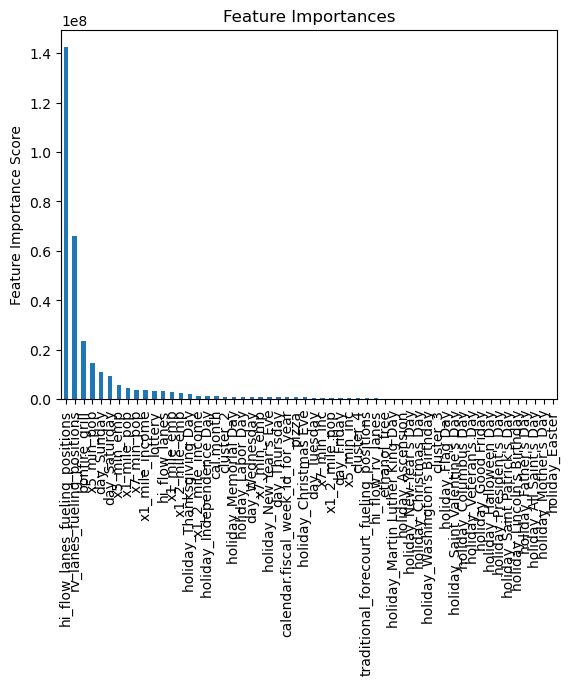


Learning Rate:  0.11

Model Report
MSE : 5.021e+04
MAE : 139.5
MAPE : 0.1473
Max Error : 2786


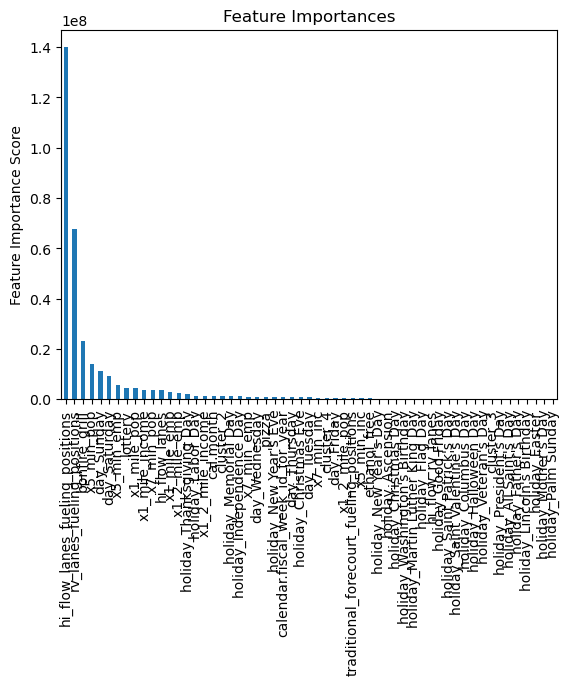


Learning Rate:  0.12000000000000001

Model Report
MSE : 4.586e+04
MAE : 133.7
MAPE : 0.1431
Max Error : 2864


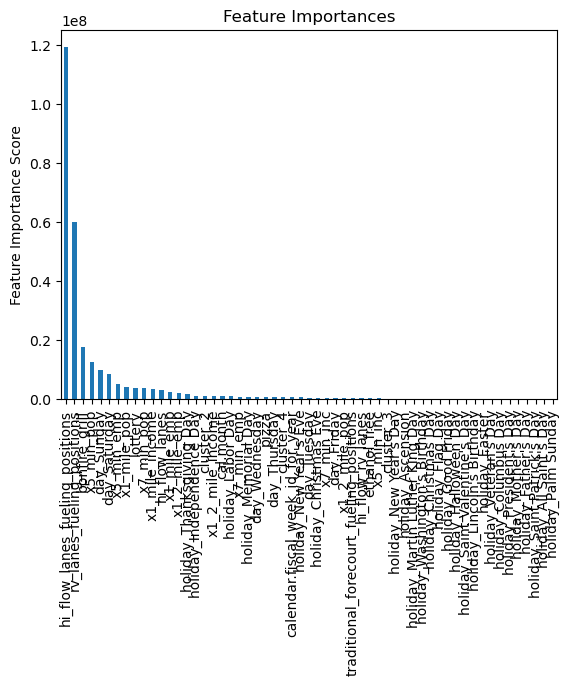


Learning Rate:  0.13

Model Report
MSE : 5.296e+04
MAE : 143.2
MAPE : 0.1502
Max Error : 2758


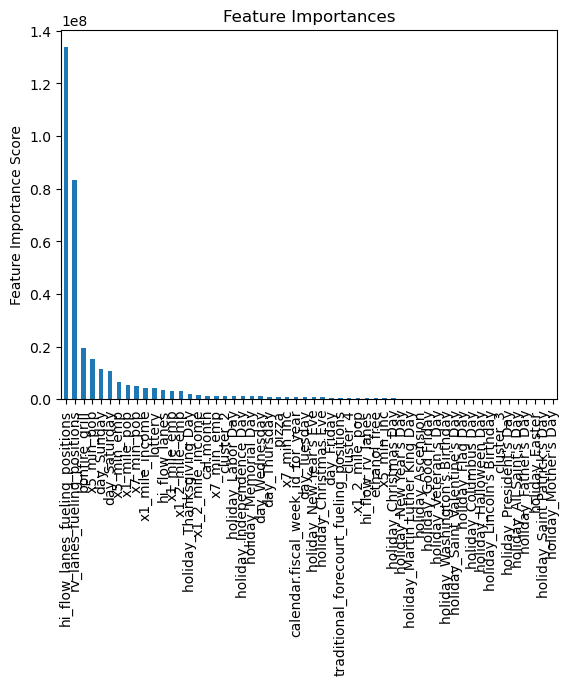


Learning Rate:  0.14

Model Report
MSE : 5.277e+04
MAE : 142.9
MAPE : 0.151
Max Error : 2606


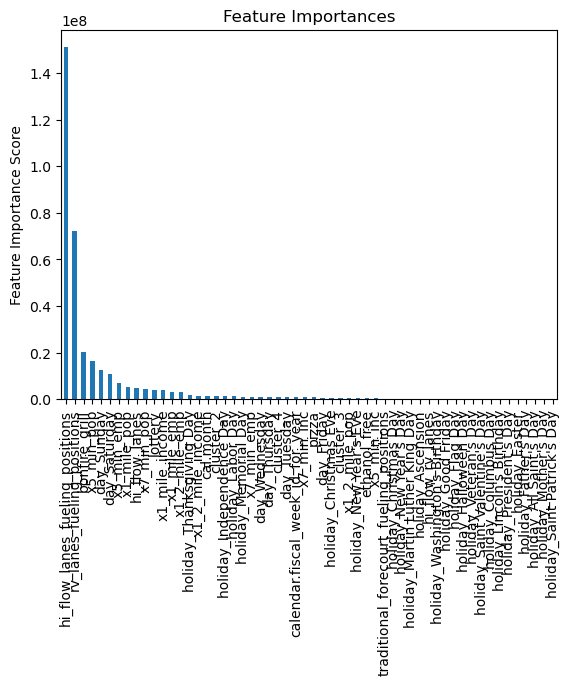


Learning Rate:  0.15000000000000002

Model Report
MSE : 5.471e+04
MAE : 145.9
MAPE : 0.1532
Max Error : 2597


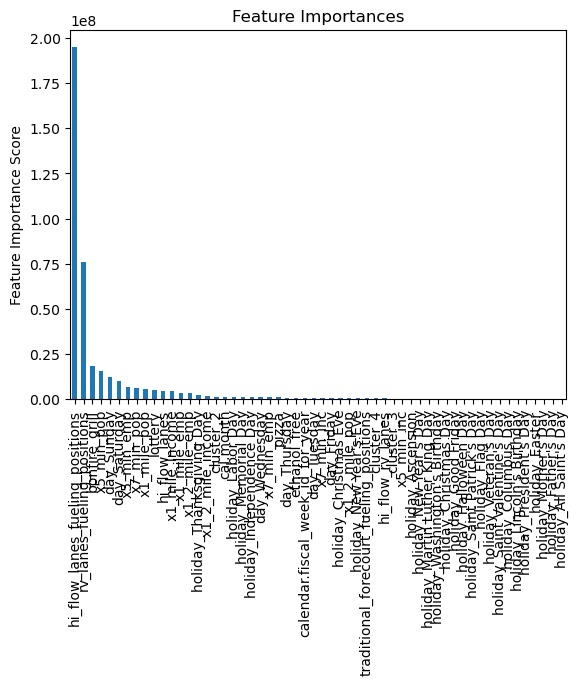


Learning Rate:  0.16

Model Report
MSE : 5.396e+04
MAE : 144.7
MAPE : 0.1527
Max Error : 2627


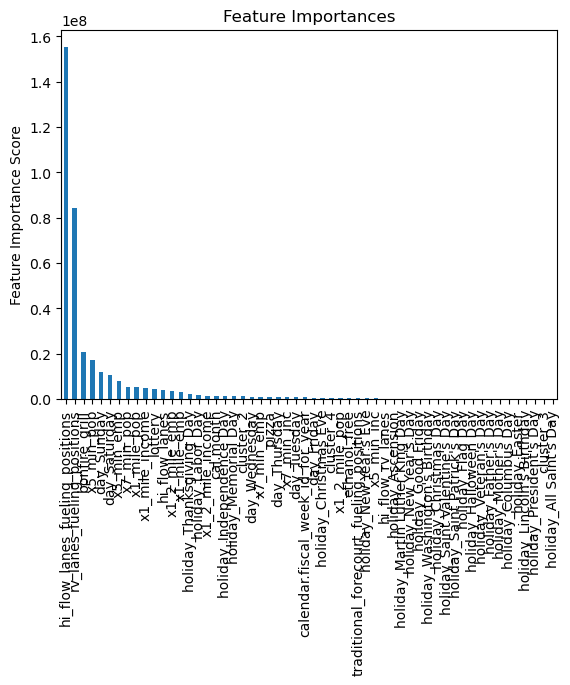


Learning Rate:  0.17

Model Report
MSE : 5.149e+04
MAE : 141.3
MAPE : 0.1482
Max Error : 2643


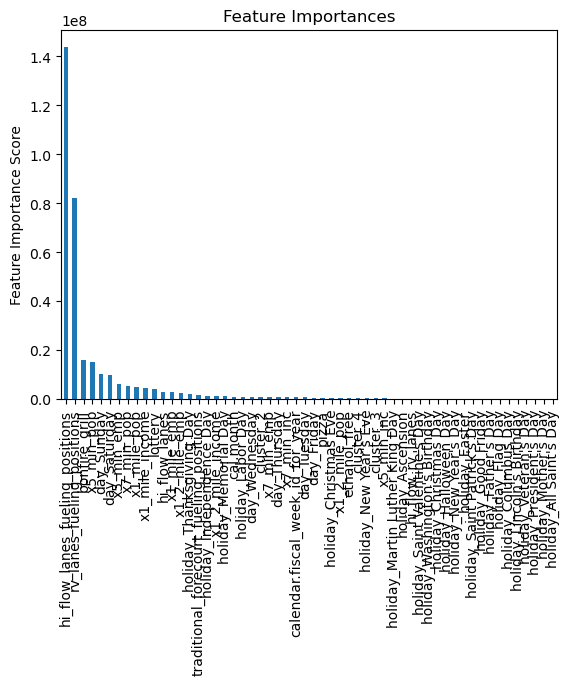


Learning Rate:  0.18

Model Report
MSE : 4.994e+04
MAE : 140
MAPE : 0.1489
Max Error : 2597


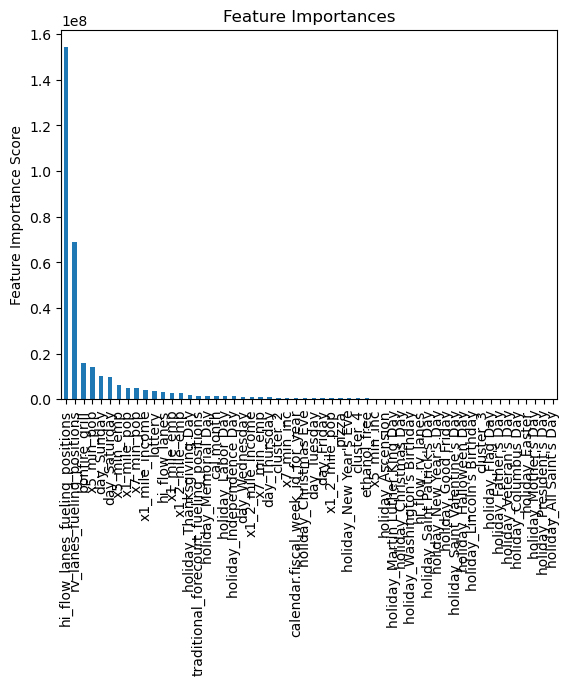


Learning Rate:  0.19

Model Report
MSE : 5.342e+04
MAE : 143.4
MAPE : 0.1514
Max Error : 2897


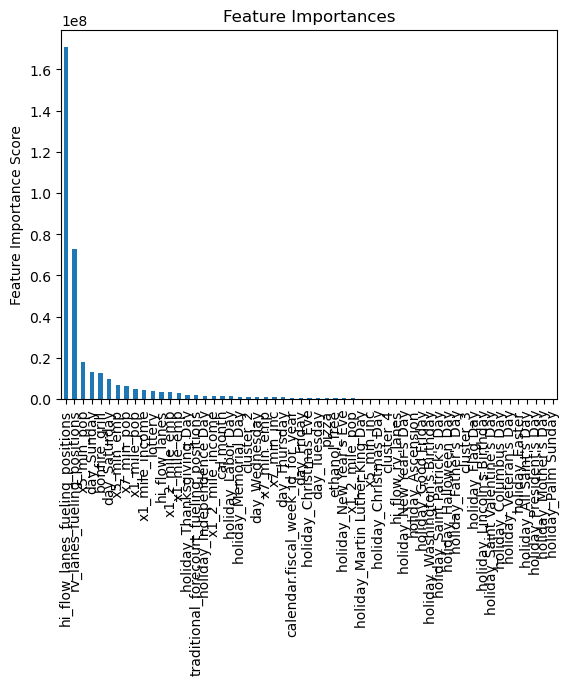


Learning Rate:  0.2

Model Report
MSE : 5.512e+04
MAE : 146.6
MAPE : 0.1535
Max Error : 2642


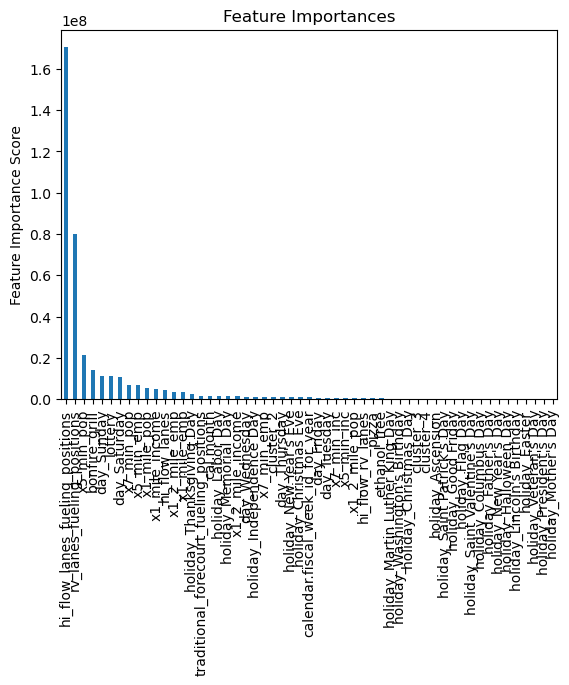

In [53]:
predictors = [x for x in X_train.columns]
target = 'diesel_x'
# learning_rates = [1e-4, 1e-3, 1e-2, 0.1, 0.25, 0.5]
learning_rates = list(np.linspace(0.1,0.2,11))

for lr in learning_rates:
    print('Learning Rate: ', lr)
    xgb6 = XGBRegressor(learning_rate =lr,
                         n_estimators=10000,
                         max_depth=9,
                         min_child_weight=7,
                         gamma=31,
                         subsample=0.87,
                         colsample_bytree=0.87,
                         reg_alpha=1.95,
                         reg_lambda=0.08,
                         objective= 'reg:squarederror',
                         nthread=12,
                         scale_pos_weight=1,
                         seed=1234)
    modelfit(xgb6, X_train, y_train, target, predictors)

# Unleaded Gasoline Training


Model Report
MSE : 4.724e+04
MAE : 148.1
MAPE : 0.07075
Max Error : 2463


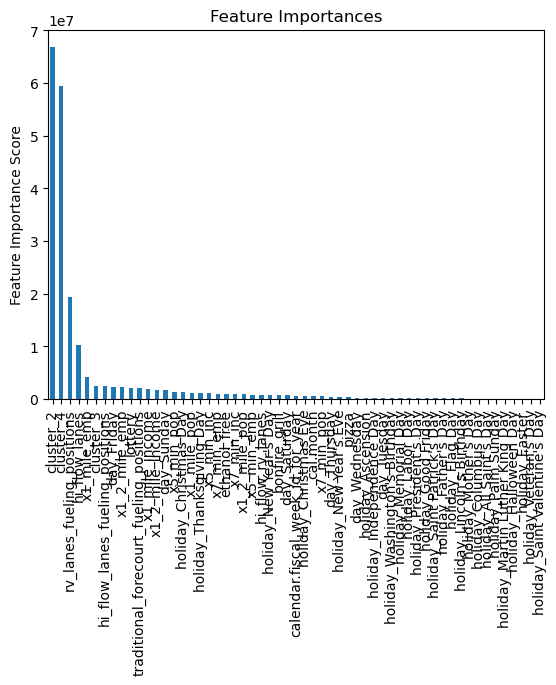

In [55]:
predictors = [x for x in X_train.columns]
target = 'unleaded'

xgb7 = XGBRegressor(
 learning_rate =0.1,
 n_estimators=1000,
 max_depth=5,
 min_child_weight=1,
 gamma=0,
 subsample=0.8,
 colsample_bytree=0.8,
 objective= 'reg:squarederror',
 nthread=12,
 scale_pos_weight=1,
 seed=1234)
modelfit(xgb7, X_train, y_train, target, predictors)

In [58]:
# Tuning max_depth and min_child_weight
param_test1 = {
 'max_depth':range(7,15,2),
 'min_child_weight':range(10,20,2)
}
gsearch1 = GridSearchCV(estimator = XGBRegressor( learning_rate =0.1, n_estimators=250, max_depth=5,
 min_child_weight=1, gamma=0, subsample=0.8, colsample_bytree=0.8,
 objective= 'reg:squarederror', nthread=8, scale_pos_weight=1, seed=1234), 
 param_grid = param_test1, scoring='neg_mean_absolute_error',n_jobs=8, cv=5)
gsearch1.fit(X_train[predictors],y_train[target])
# display(gsearch1.cv_results_)
print('Best Parmeters: ', gsearch1.best_params_)
print('Best Score: ', gsearch1.best_score_)

Best Parmeters:  {'max_depth': 11, 'min_child_weight': 14}
Best Score:  -212.50221673381913


In [59]:
# Fine-tuning max_depth and min_child_weight
param_test2 = {
 'max_depth':[10,11,12],
 'min_child_weight':[13,14,15]
}
gsearch2 = GridSearchCV(estimator = XGBRegressor( learning_rate =0.1, n_estimators=250, max_depth=5,
 min_child_weight=1, gamma=0, subsample=0.8, colsample_bytree=0.8,
 objective= 'reg:squarederror', nthread=8, scale_pos_weight=1, seed=1234), 
 param_grid = param_test2, scoring='neg_mean_absolute_error',n_jobs=8, cv=5)
gsearch2.fit(X_train[predictors],y_train[target])
# display(gsearch2.cv_results_)
print('Best Parmeters: ', gsearch2.best_params_)
print('Best Score: ', gsearch2.best_score_)

Best Parmeters:  {'max_depth': 10, 'min_child_weight': 14}
Best Score:  -212.11967596321603


In [62]:
# Tuning Gamma
param_test3 = {
    'max_depth':[10],
    'min_child_weight':[14],
#     'gamma':range(1,100,5)
    'gamma':list(np.linspace(5,10,21))
}
gsearch3 = GridSearchCV(estimator = XGBRegressor( learning_rate =0.1, n_estimators=250, max_depth=5,
 min_child_weight=1, gamma=0, subsample=0.8, colsample_bytree=0.8,
 objective= 'reg:squarederror', nthread=8, scale_pos_weight=1, seed=1234), 
 param_grid = param_test3, scoring='neg_mean_absolute_error',n_jobs=8, cv=5)
gsearch3.fit(X_train[predictors],y_train[target])
# display(gsearch3.cv_results_)
print('Best Parmeters: ', gsearch3.best_params_)
print('Best Score: ', gsearch3.best_score_)

Best Parmeters:  {'gamma': 6.5, 'max_depth': 10, 'min_child_weight': 14}
Best Score:  -211.82711312734074


In [65]:
# Tuning subsample and colsample_bytree ratios
param_test4 = {
    'max_depth':[10],
    'min_child_weight':[14],
    'gamma':[6.5],
#     'subsample':[i/10.0 for i in range(5,10)],
#     'colsample_bytree':[i/10.0 for i in range(5,10)]
    'subsample':[i/100.0 for i in range(90,96)],
    'colsample_bytree':[i/100.0 for i in range(60,66)]
}
gsearch4 = GridSearchCV(estimator = XGBRegressor( learning_rate =0.1, n_estimators=250, max_depth=5,
 min_child_weight=1, gamma=0, subsample=0.8, colsample_bytree=0.8,
 objective= 'reg:squarederror', nthread=8, scale_pos_weight=1, seed=1234), 
 param_grid = param_test4, scoring='neg_mean_absolute_error',n_jobs=-1, cv=5)
gsearch4.fit(X_train[predictors],y_train[target])
# display(gsearch4.cv_results_)
print('Best Parmeters: ', gsearch4.best_params_)
print('Best Score: ', gsearch4.best_score_)

Best Parmeters:  {'colsample_bytree': 0.6, 'gamma': 6.5, 'max_depth': 10, 'min_child_weight': 14, 'subsample': 0.94}
Best Score:  -210.23230499545116


In [68]:
# Tuning L1 & L2 regularization coefficients (ElastiNet)
param_test5 = {
    'max_depth':[10],
    'min_child_weight':[14],
    'gamma':[6.5],
    'subsample':[0.94],
    'colsample_bytree':[0.6],
#     'reg_alpha':[1e-4, 1e-3, 1e-2, 0.1, 0.25, 0.5],
#     'reg_lambda':[1e-4, 1e-3, 1e-2, 0.1, 0.25, 0.5]
    'reg_alpha':list(np.linspace(0.05,0.2,6)),
    'reg_lambda':list(np.linspace(0.1,0.2,6))
}
gsearch5 = GridSearchCV(estimator = XGBRegressor( learning_rate =0.1, n_estimators=250, max_depth=5,
 min_child_weight=1, gamma=0, subsample=0.8, colsample_bytree=0.8,
 objective= 'reg:squarederror', nthread=8, scale_pos_weight=1, seed=1234), 
 param_grid = param_test5, scoring='neg_mean_absolute_error',n_jobs=8, cv=5)
gsearch5.fit(X_train[predictors],y_train[target])
# display(gsearch5.cv_results_)
print('Best Parmeters: ', gsearch5.best_params_)
print('Best Score: ', gsearch5.best_score_)

Best Parmeters:  {'colsample_bytree': 0.6, 'gamma': 6.5, 'max_depth': 10, 'min_child_weight': 14, 'reg_alpha': 0.11000000000000001, 'reg_lambda': 0.14, 'subsample': 0.94}
Best Score:  -210.12935753251537


In [69]:
param_test6 = {
    'max_depth':[10],
    'min_child_weight':[14],
    'gamma':[6.5],
    'subsample':[0.94],
    'colsample_bytree':[0.6],
    'reg_alpha':[0.11],
    'reg_lambda':[0.14]
}
gsearch6 = GridSearchCV(estimator = XGBRegressor( learning_rate =0.1, n_estimators=250, max_depth=5,
 min_child_weight=1, gamma=0, subsample=0.8, colsample_bytree=0.8,
 objective= 'reg:squarederror', nthread=8, scale_pos_weight=1, seed=1234), 
 param_grid = param_test6, scoring='neg_mean_absolute_error',n_jobs=8, cv=5)
gsearch6.fit(X_train[predictors],y_train[target])
display(gsearch6.cv_results_)
print('Best Parmeters: ', gsearch6.best_params_)
print('Best Score: ', gsearch6.best_score_)

{'mean_fit_time': array([1.90985909]),
 'std_fit_time': array([0.04488487]),
 'mean_score_time': array([0.00821075]),
 'std_score_time': array([0.00132754]),
 'param_colsample_bytree': masked_array(data=[0.6],
              mask=[False],
        fill_value='?',
             dtype=object),
 'param_gamma': masked_array(data=[6.5],
              mask=[False],
        fill_value='?',
             dtype=object),
 'param_max_depth': masked_array(data=[10],
              mask=[False],
        fill_value='?',
             dtype=object),
 'param_min_child_weight': masked_array(data=[14],
              mask=[False],
        fill_value='?',
             dtype=object),
 'param_reg_alpha': masked_array(data=[0.11],
              mask=[False],
        fill_value='?',
             dtype=object),
 'param_reg_lambda': masked_array(data=[0.14],
              mask=[False],
        fill_value='?',
             dtype=object),
 'param_subsample': masked_array(data=[0.94],
              mask=[False],
       

Best Parmeters:  {'colsample_bytree': 0.6, 'gamma': 6.5, 'max_depth': 10, 'min_child_weight': 14, 'reg_alpha': 0.11, 'reg_lambda': 0.14, 'subsample': 0.94}
Best Score:  -210.12935753251537


Learning Rate:  0.4

Model Report
MSE : 5.28e+04
MAE : 155
MAPE : 0.07476
Max Error : 2404


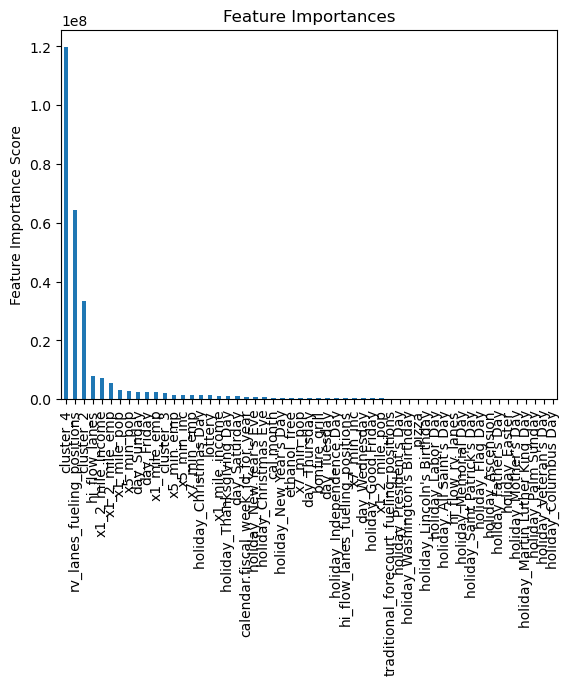


Learning Rate:  0.42000000000000004

Model Report
MSE : 5.321e+04
MAE : 155.9
MAPE : 0.07485
Max Error : 2451


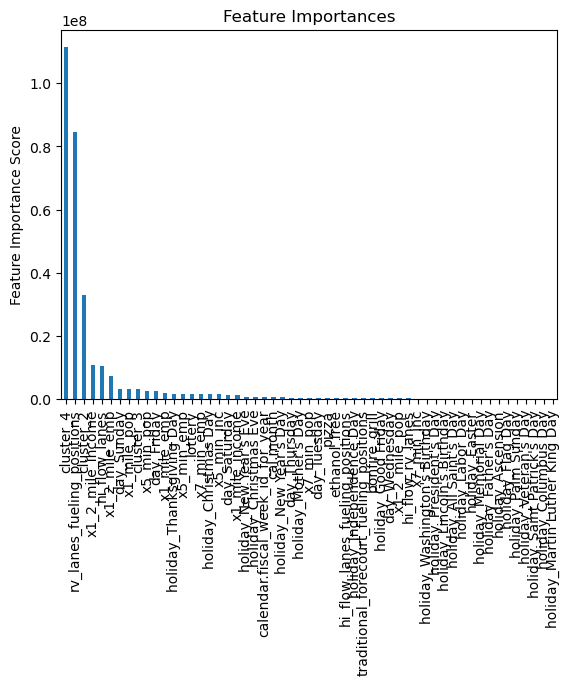


Learning Rate:  0.44

Model Report
MSE : 5.968e+04
MAE : 164.6
MAPE : 0.079
Max Error : 2657


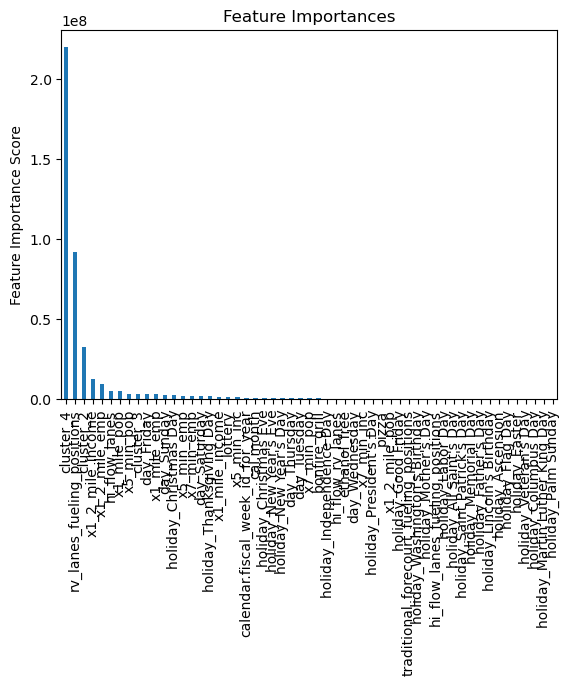


Learning Rate:  0.46

Model Report
MSE : 5.237e+04
MAE : 154.7
MAPE : 0.07422
Max Error : 2513


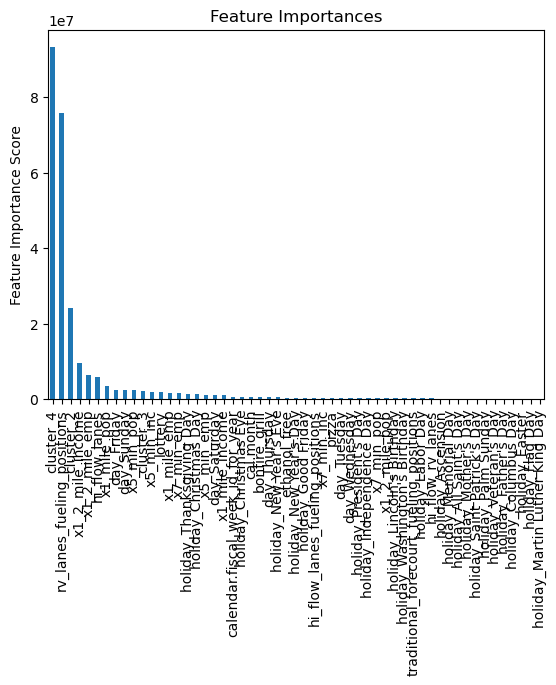


Learning Rate:  0.48

Model Report
MSE : 4.994e+04
MAE : 152
MAPE : 0.07275
Max Error : 2366


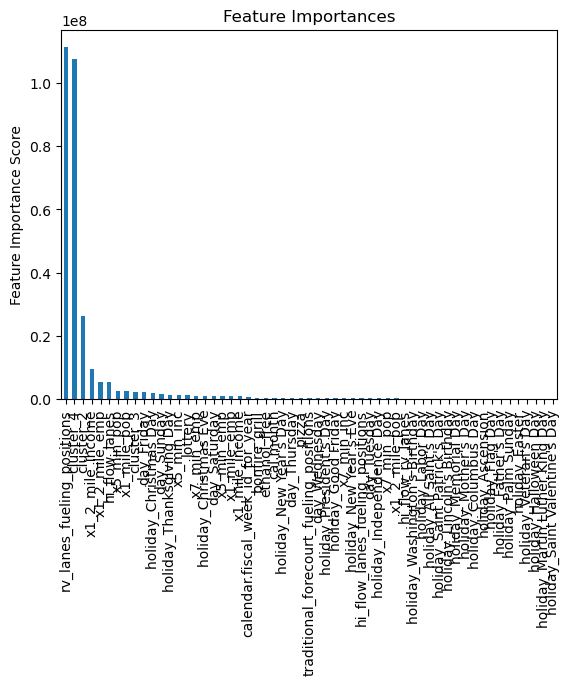


Learning Rate:  0.5

Model Report
MSE : 4.726e+04
MAE : 147.2
MAPE : 0.07078
Max Error : 2307


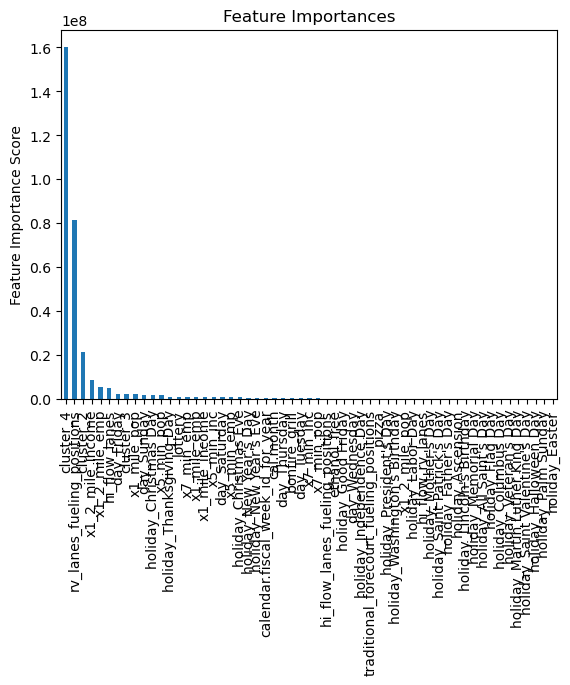


Learning Rate:  0.52

Model Report
MSE : 5.648e+04
MAE : 162.1
MAPE : 0.07793
Max Error : 2524


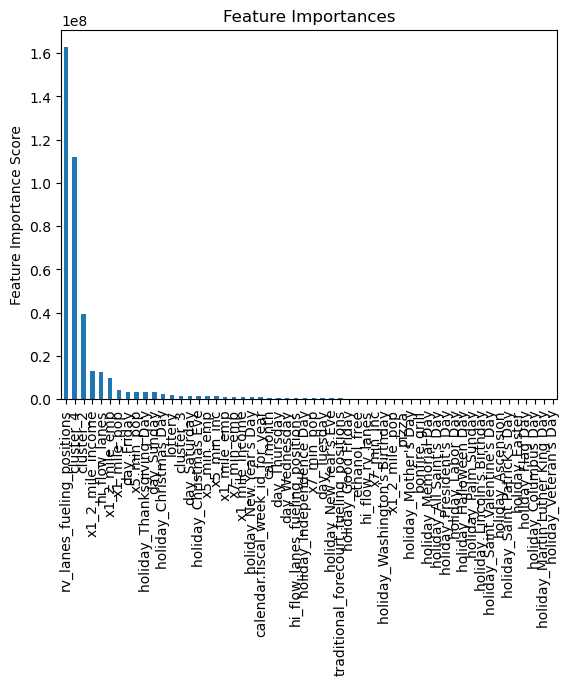


Learning Rate:  0.54

Model Report
MSE : 5.612e+04
MAE : 161.8
MAPE : 0.07757
Max Error : 2557


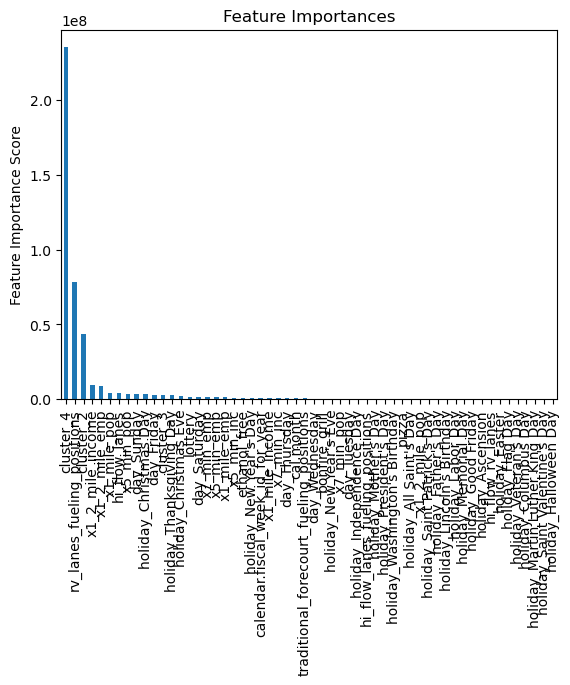


Learning Rate:  0.56

Model Report
MSE : 5.711e+04
MAE : 162.6
MAPE : 0.07806
Max Error : 2555


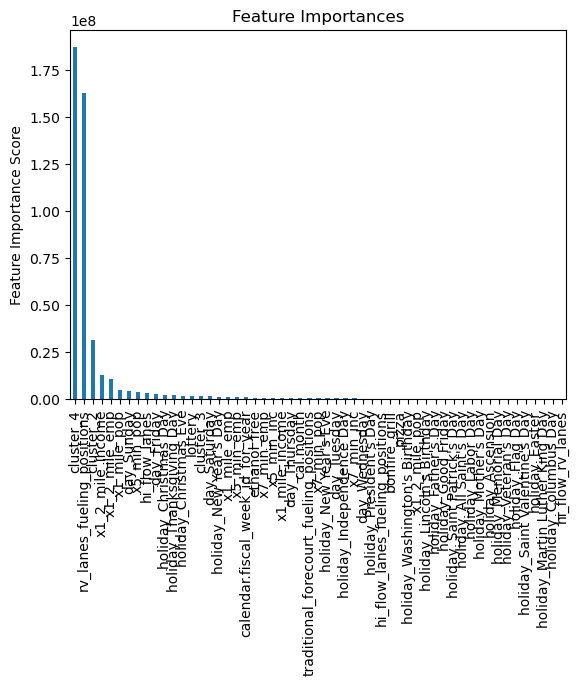


Learning Rate:  0.58

Model Report
MSE : 5.781e+04
MAE : 162.8
MAPE : 0.07822
Max Error : 2956


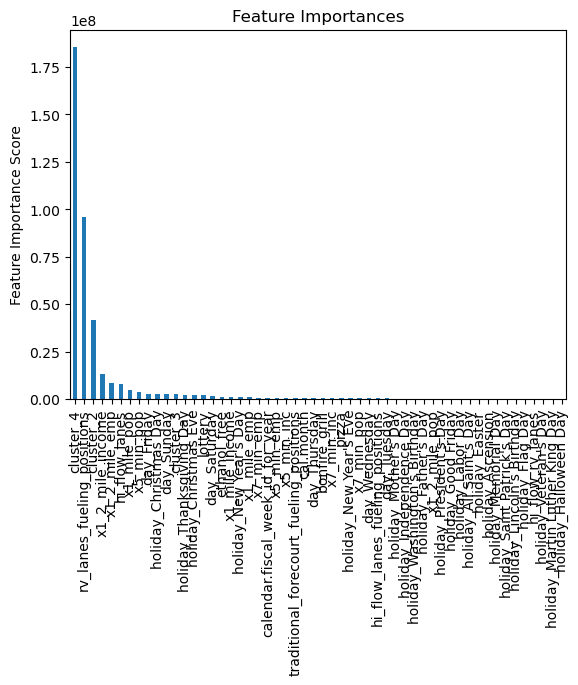


Learning Rate:  0.6

Model Report
MSE : 5.583e+04
MAE : 161.1
MAPE : 0.07723
Max Error : 2407


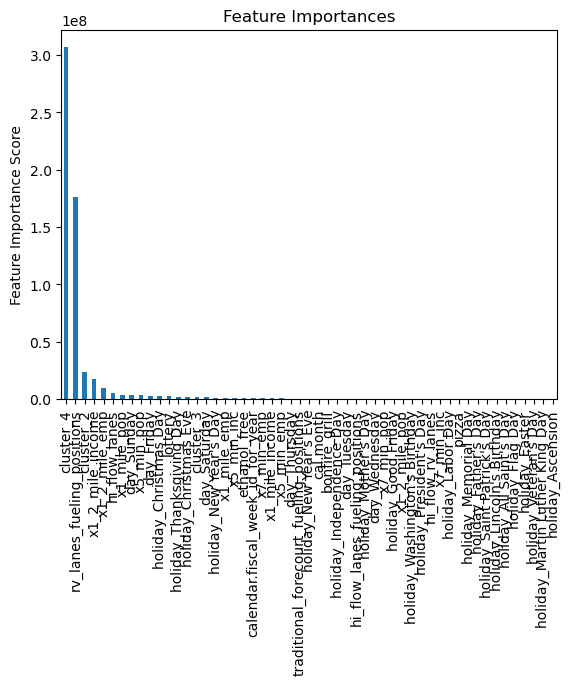

In [74]:
predictors = [x for x in X_train.columns]
target = 'unleaded'
# learning_rates = [0.1, 0.25, 0.5,0.75,1,5]
learning_rates = list(np.linspace(0.4,0.6,11))

for lr in learning_rates:
    print('Learning Rate: ', lr)
    xgb6 = XGBRegressor(learning_rate =lr,
                         n_estimators=10000,
                         max_depth=10,
                         min_child_weight=14,
                         gamma=6.5,
                         subsample=0.94,
                         colsample_bytree=0.6,
                         reg_alpha=0.11,
                         reg_lambda=0.14,
                         objective= 'reg:squarederror',
                         nthread=12,
                         scale_pos_weight=1,
                         seed=1234)
    modelfit(xgb6, X_train, y_train, target, predictors)

# Tuned Models


Model Report
MSE : 4.647e+04
MAE : 143.4
MAPE : 1.778e+15
Max Error : 2146


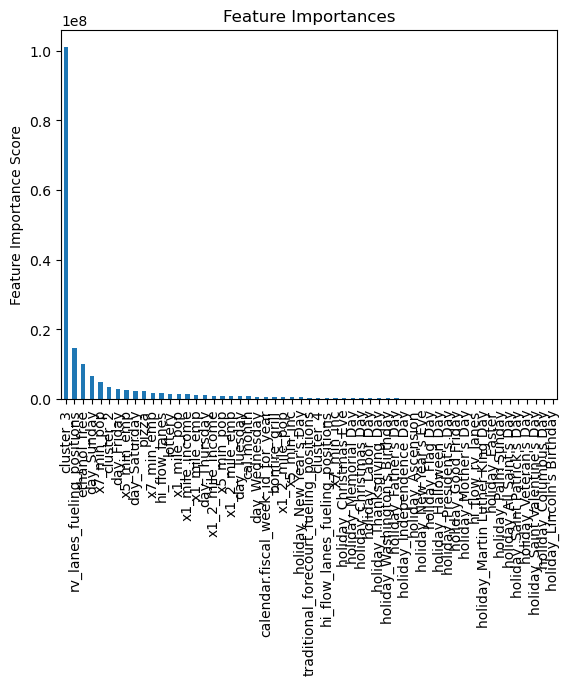

In [14]:
# Inside Sales
predictors = [x for x in X_train.columns]
target = 'inside_sales'

xgb_is = XGBRegressor(
 learning_rate =0.1625,
 n_estimators=10000,
 max_depth=9,
 min_child_weight=13,
 gamma=64,
 subsample=0.81,
 colsample_bytree=0.82,
 reg_alpha=0.028,
 reg_lambda=2.8e-6,
 objective= 'reg:squarederror',
 nthread=12,
 scale_pos_weight=1,
 seed=1234)
modelfit(xgb_is, X_train, y_train, target, predictors)


Model Report
MSE : 4173
MAE : 44.69
MAPE : 5.574e+14
Max Error : 602.9


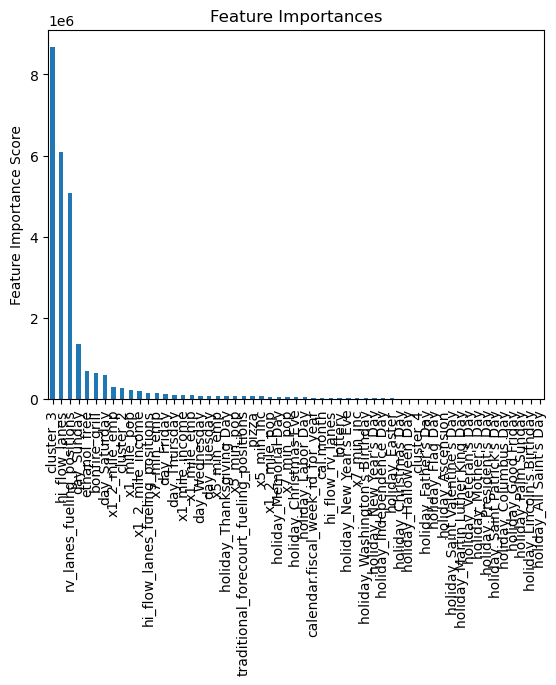

In [15]:
# Food Service
predictors = [x for x in X_train.columns]
target = 'food_service'

xgb_fs = XGBRegressor(
 learning_rate =6.2e-2,
 n_estimators=10000,
 max_depth=10,
 min_child_weight=11,
 gamma=58,
 subsample=0.8,
 colsample_bytree=0.8,
 reg_alpha=6e-2,
 reg_lambda=0.65,
 objective= 'reg:squarederror',
 nthread=12,
 scale_pos_weight=1,
 seed=1234)
modelfit(xgb_fs, X_train, y_train, target, predictors)


Model Report
MSE : 4.586e+04
MAE : 133.7
MAPE : 0.1431
Max Error : 2864


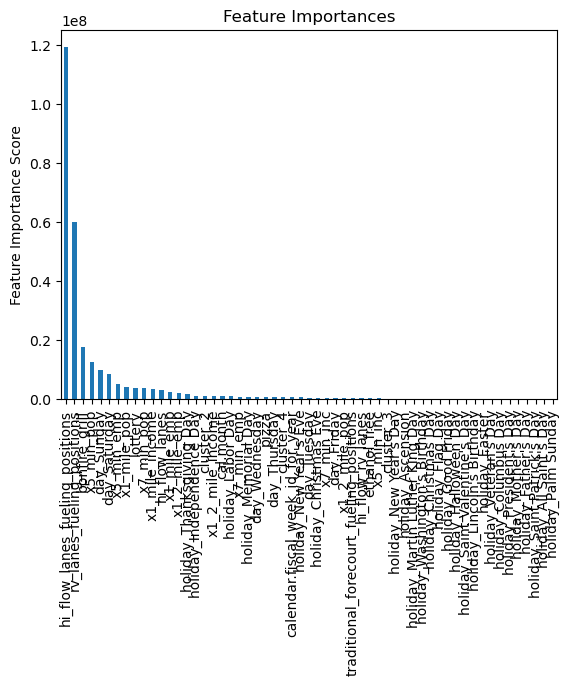

In [16]:
# Diesel
predictors = [x for x in X_train.columns]
target = 'diesel_x'

xgb_diesel = XGBRegressor(
 learning_rate =0.12,
 n_estimators=10000,
 max_depth=9,
 min_child_weight=7,
 gamma=31,
 subsample=0.87,
 colsample_bytree=0.87,
 reg_alpha=1.95,
 reg_lambda=0.08,
 objective= 'reg:squarederror',
 nthread=12,
 scale_pos_weight=1,
 seed=1234)
modelfit(xgb_diesel, X_train, y_train, target, predictors)


Model Report
MSE : 4.726e+04
MAE : 147.2
MAPE : 0.07078
Max Error : 2307


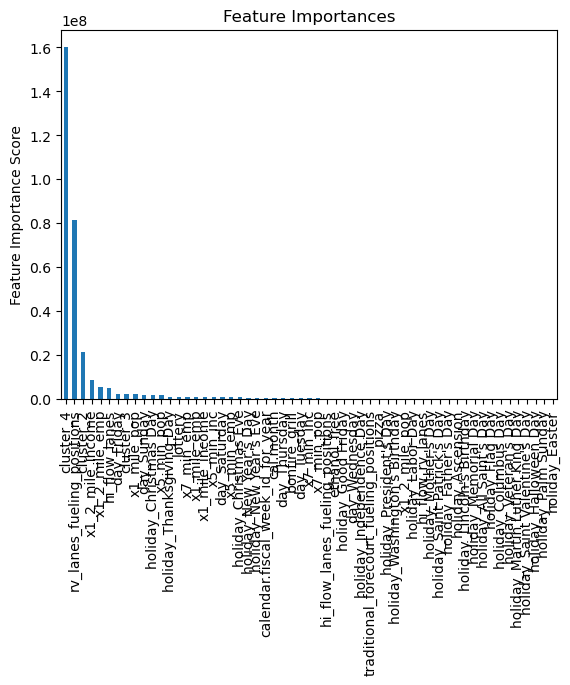

In [17]:
# Unleaded
predictors = [x for x in X_train.columns]
target = 'unleaded'

xgb_unleaded = XGBRegressor(
 learning_rate =0.5,
 n_estimators=10000,
 max_depth=10,
 min_child_weight=14,
 gamma=6.5,
 subsample=0.94,
 colsample_bytree=0.6,
 reg_alpha=0.11,
 reg_lambda=0.14,
 objective= 'reg:squarederror',
 nthread=12,
 scale_pos_weight=1,
 seed=1234)
modelfit(xgb_unleaded, X_train, y_train, target, predictors)

In [18]:
pickle.dump(xgb_is, open('./models/Cluster_Norm/inside_sales.sav', 'wb'))
pickle.dump(xgb_fs, open('./models/Cluster_Norm/food_service.sav', 'wb'))
pickle.dump(xgb_diesel, open('./models/Cluster_Norm/diesel.sav', 'wb'))
pickle.dump(xgb_unleaded, open('./models/Cluster_Norm/unleaded.sav', 'wb'))

# Analysis

In [19]:
def TestStoreAnalysis(site_id):
    teststore_df = test_df.loc[test_df['site_id_msba'] == site_id]

    target_cols = target_cols = ['site_id_msba', 'calendar.calendar_day_date', 'inside_sales', 'food_service','diesel_x', 'unleaded']
    X = teststore_df.drop(columns=target_cols)
    y = pd.DataFrame(teststore_df[target_cols])
    # Predict sales for Store
    is_pred = xgb_is.predict(X)
    fs_pred = xgb_fs.predict(X)
    d_pred = xgb_diesel.predict(X)
    u_pred = xgb_unleaded.predict(X)

    teststore_df['is_pred'] = is_pred
    teststore_df['fs_pred'] = fs_pred
    teststore_df['diesel_pred'] = d_pred
    teststore_df['unleaded_pred'] = u_pred

    teststore_df['is_pred_err'] = teststore_df.is_pred - teststore_df.inside_sales
    teststore_df['fs_pred_err'] = teststore_df.fs_pred - teststore_df.food_service
    teststore_df['diesel_pred_err'] = teststore_df.diesel_pred - teststore_df.diesel_x
    teststore_df['unleaded_pred_err'] = teststore_df.unleaded_pred - teststore_df.unleaded
    
    print('Store #', site_id)
    print('Annual Cumulative Error(Inside Sales): '  , teststore_df['is_pred_err'].sum())
    print('Annual Cumulative Error % (Inside Sales): '  , (teststore_df['is_pred_err'].sum() / teststore_df['inside_sales'].sum()) * 100)
    print('Annual Cumulative Error(Food Service): '  , teststore_df['fs_pred_err'].sum())
    print('Annual Cumulative Error % (Food Service): '  , (teststore_df['fs_pred_err'].sum() / teststore_df['food_service'].sum()) * 100)
    print('Annual Cumulative Error(Diesel Sales): '  , teststore_df['diesel_pred_err'].sum())
    print('Annual Cumulative Error % (Diesel Sales): '  , (teststore_df['diesel_pred_err'].sum() / teststore_df['diesel_x'].sum()) * 100)
    print('Annual Cumulative Error(Unleaded Sales): ', teststore_df['unleaded_pred_err'].sum())
    print('Annual Cumulative Error % (Unleaded Sales): '  , (teststore_df['unleaded_pred_err'].sum() / teststore_df['unleaded'].sum()) * 100)
    
    fig, axes = plt.subplots(2,2,figsize=(10, 10))

    sns.barplot(data=teststore_df, 
                 x= 'calendar.calendar_day_date', 
                 y= teststore_df['inside_sales'].cumsum(), 
                 label= 'Actual Sales',
                 ax= axes[0,0],
                 color='blue')
    sns.lineplot(data=teststore_df, 
                 x='calendar.calendar_day_date', 
                 y=(teststore_df['is_pred']).cumsum(), 
                 label='Prediction', 
                 ax= axes[0,0])
    axes[0,0].set_title('Inside Sales')
    axes[0,0].set(xlabel='Date', ylabel='Inside Sales ($M)')
    axes[0,0].xaxis.set_major_locator(plt.MaxNLocator(5))
    axes[0,0].set_title('Inside Sales')
    sns.barplot(data=teststore_df, 
                 x= 'calendar.calendar_day_date', 
                 y= (teststore_df['food_service']).cumsum(), 
                 label= 'Actual Sales',
                 ax= axes[0,1],
                 color='blue')
    sns.lineplot(data=teststore_df, 
                 x='calendar.calendar_day_date', 
                 y=teststore_df['fs_pred'].cumsum(), 
                 label='Prediction', 
                 ax= axes[0,1])
    axes[0,1].set_title('Food Service')
    axes[0,1].set(xlabel='Date', ylabel='Food Service ($)')
    axes[0,1].xaxis.set_major_locator(plt.MaxNLocator(5))
    sns.barplot(data=teststore_df, 
                 x= 'calendar.calendar_day_date', 
                 y= teststore_df['diesel_x'].cumsum(), 
                 label= 'Actual Sales',
                 ax= axes[1,0],
                 color='blue')
    sns.lineplot(data=teststore_df, 
                 x='calendar.calendar_day_date', 
                 y=(teststore_df['diesel_pred']).cumsum(), 
                 label='Prediction', 
                 ax= axes[1,0])
    axes[1,0].set_title('Diesel')
    axes[1,0].set(xlabel='Date', ylabel='Diesel Sales (gallons M)')
    axes[1,0].xaxis.set_major_locator(plt.MaxNLocator(5))
    sns.barplot(data=teststore_df, 
                 x= 'calendar.calendar_day_date', 
                 y= teststore_df['unleaded'].cumsum(), 
                 label= 'Actual Sales',
                 ax= axes[1,1],
                 color='blue')
    sns.lineplot(data=teststore_df, 
                 x='calendar.calendar_day_date', 
                 y=(teststore_df['unleaded_pred']).cumsum(), 
                 label='Prediction', 
                 ax= axes[1,1])
    axes[1,1].set_title('Unleaded')
    axes[1,1].set(xlabel='Date', ylabel='Gasoline Sales (gallons M)')
    axes[1,1].xaxis.set_major_locator(plt.MaxNLocator(5))
    plt.show()
    
    plt.subplots(figsize=(20, 5))
    sns.barplot(data=teststore_df, 
                x= 'calendar.calendar_day_date', 
                y= teststore_df['is_pred_err'])
    plt.show()
    plt.subplots(figsize=(20, 5))
    sns.barplot(data=teststore_df, 
                x= 'calendar.calendar_day_date', 
                y= teststore_df['fs_pred_err'])
    plt.show()
    plt.subplots(figsize=(20, 5))
    sns.barplot(data=teststore_df, 
                x= 'calendar.calendar_day_date', 
                y= teststore_df['diesel_pred_err'])
    plt.show()
    plt.subplots(figsize=(20, 5))
    sns.barplot(data=teststore_df, 
                x= 'calendar.calendar_day_date', 
                y= teststore_df['unleaded_pred_err'])
    plt.show()  

Store # 22925
Annual Cumulative Error(Inside Sales):  -229533.8159140625
Annual Cumulative Error % (Inside Sales):  -22.173246854677046
Annual Cumulative Error(Food Service):  -65015.836961791996
Annual Cumulative Error % (Food Service):  -30.04820814488497
Annual Cumulative Error(Diesel Sales):  27860.25983544159
Annual Cumulative Error % (Diesel Sales):  39.43610579963266
Annual Cumulative Error(Unleaded Sales):  149990.14345996093
Annual Cumulative Error % (Unleaded Sales):  22.27350555623209


C:\Users\pengo\AppData\Local\Temp\ipykernel_20840\347169114.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  teststore_df['is_pred'] = is_pred
C:\Users\pengo\AppData\Local\Temp\ipykernel_20840\347169114.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  teststore_df['fs_pred'] = fs_pred
C:\Users\pengo\AppData\Local\Temp\ipykernel_20840\347169114.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

Se

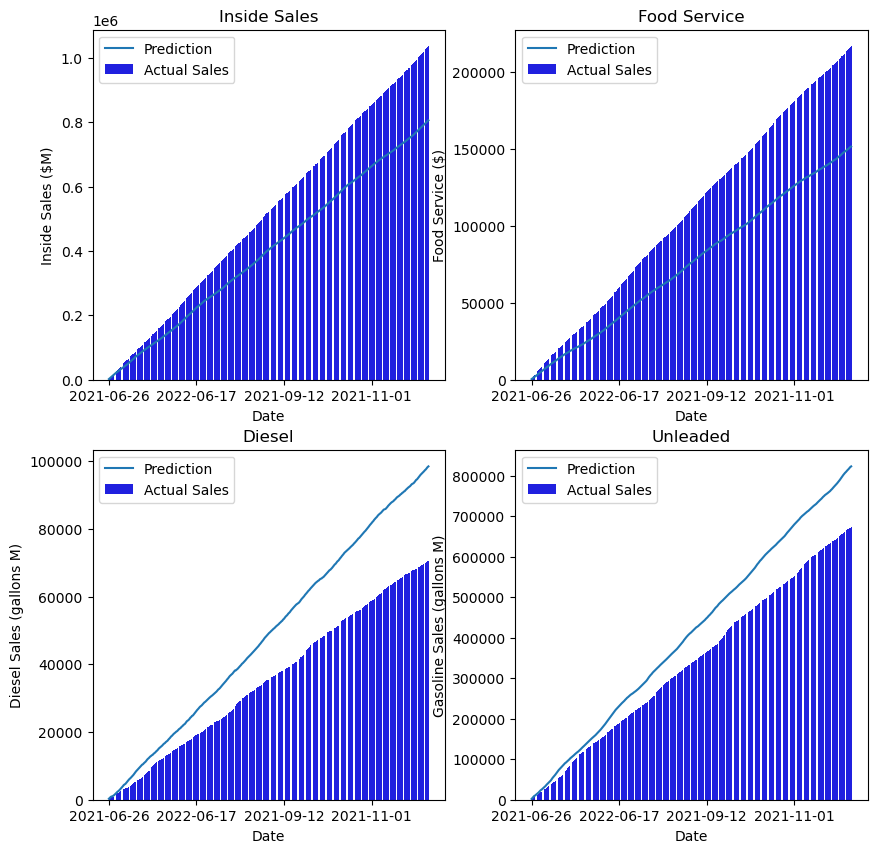

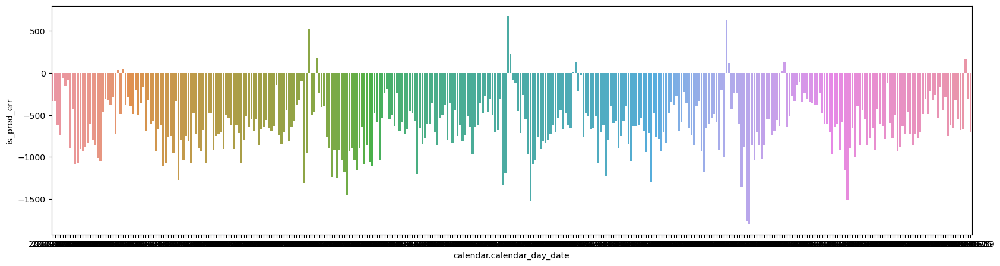

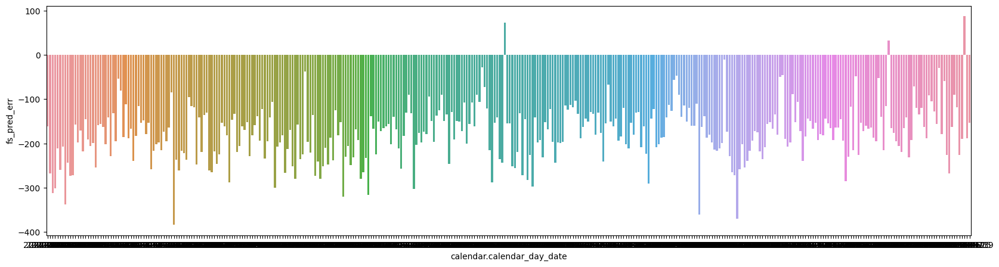

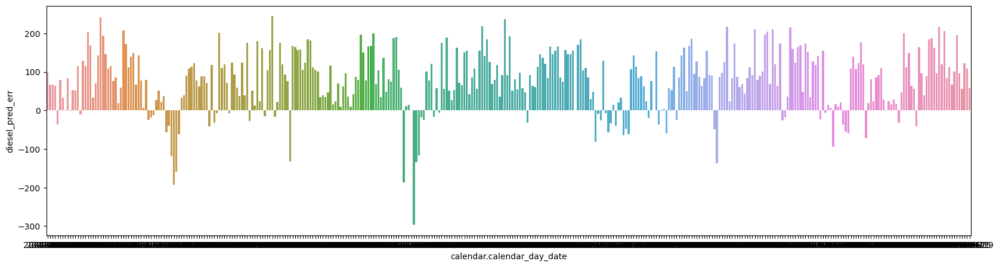

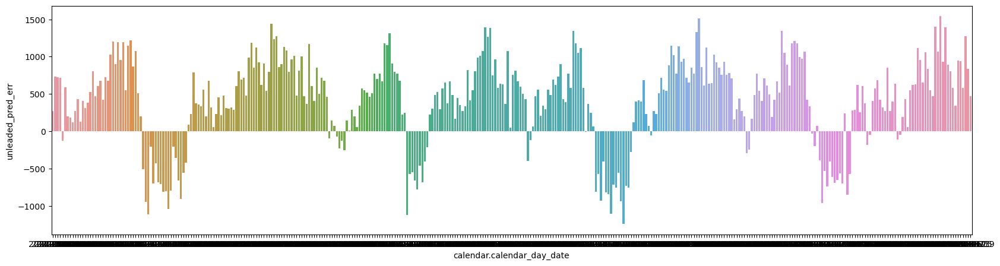

C:\Users\pengo\AppData\Local\Temp\ipykernel_20840\347169114.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  teststore_df['is_pred'] = is_pred
C:\Users\pengo\AppData\Local\Temp\ipykernel_20840\347169114.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  teststore_df['fs_pred'] = fs_pred
C:\Users\pengo\AppData\Local\Temp\ipykernel_20840\347169114.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

Se

Store # 22680
Annual Cumulative Error(Inside Sales):  -48966.42174609375
Annual Cumulative Error % (Inside Sales):  -5.534266102055123
Annual Cumulative Error(Food Service):  13760.365869995116
Annual Cumulative Error % (Food Service):  7.035423368337092
Annual Cumulative Error(Diesel Sales):  55446.7168565979
Annual Cumulative Error % (Diesel Sales):  107.4267957233658
Annual Cumulative Error(Unleaded Sales):  479461.8817666016
Annual Cumulative Error % (Unleaded Sales):  135.36132952959355


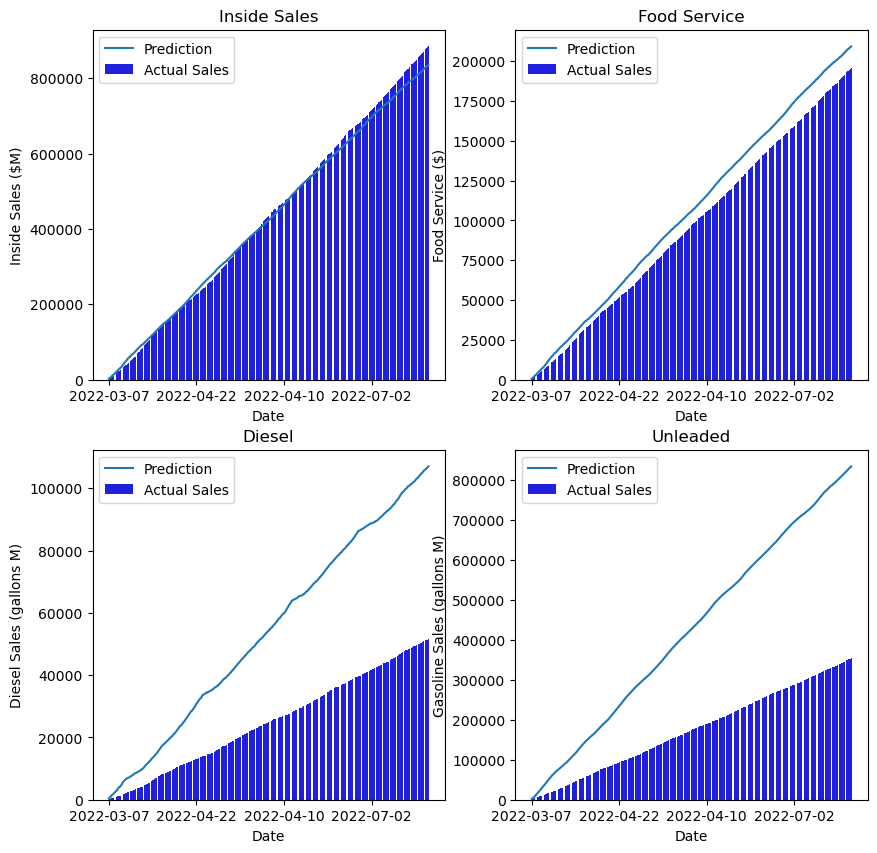

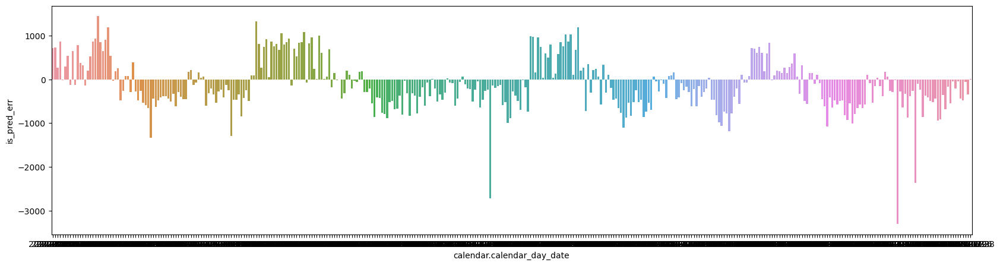

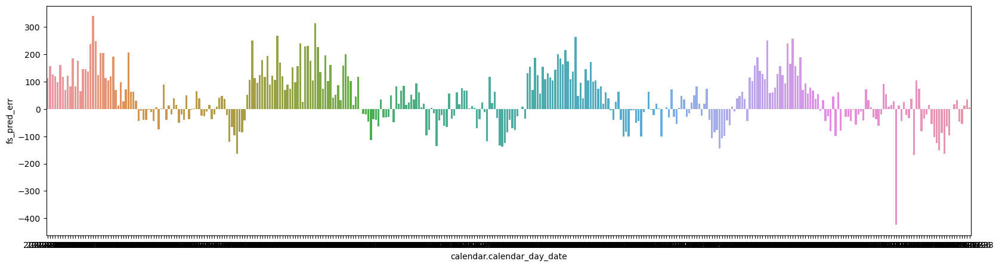

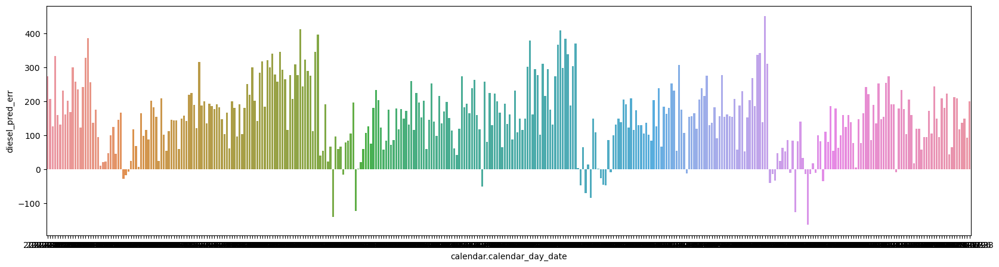

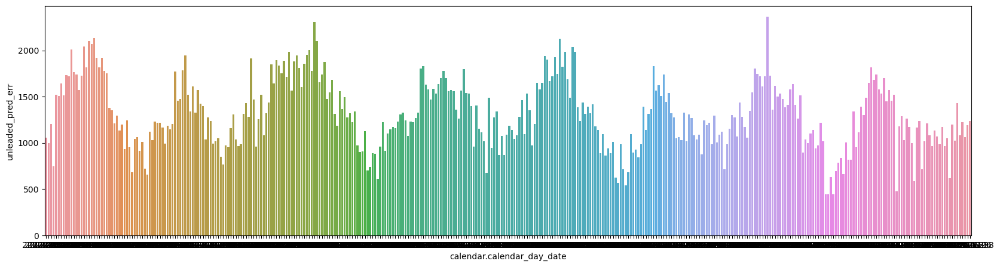

C:\Users\pengo\AppData\Local\Temp\ipykernel_20840\347169114.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  teststore_df['is_pred'] = is_pred
C:\Users\pengo\AppData\Local\Temp\ipykernel_20840\347169114.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  teststore_df['fs_pred'] = fs_pred
C:\Users\pengo\AppData\Local\Temp\ipykernel_20840\347169114.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

Se

Store # 23415
Annual Cumulative Error(Inside Sales):  368765.3826357422
Annual Cumulative Error % (Inside Sales):  26.810944432148
Annual Cumulative Error(Food Service):  109729.55813769532
Annual Cumulative Error % (Food Service):  25.57353432441669
Annual Cumulative Error(Diesel Sales):  265886.0416206055
Annual Cumulative Error % (Diesel Sales):  29.359924681093457
Annual Cumulative Error(Unleaded Sales):  -86393.37519537353
Annual Cumulative Error % (Unleaded Sales):  -13.589060045115541


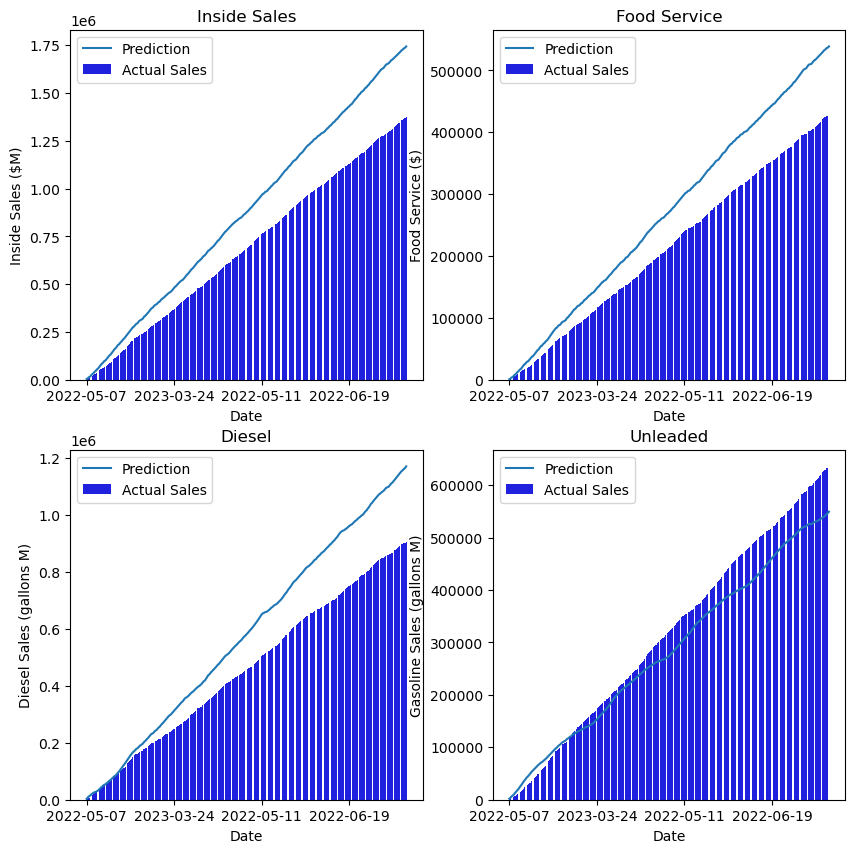

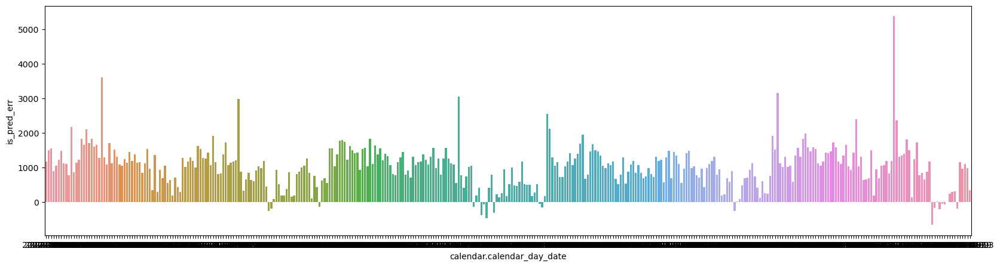

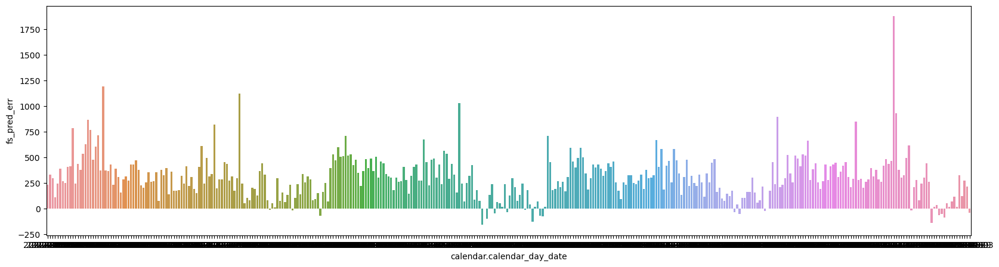

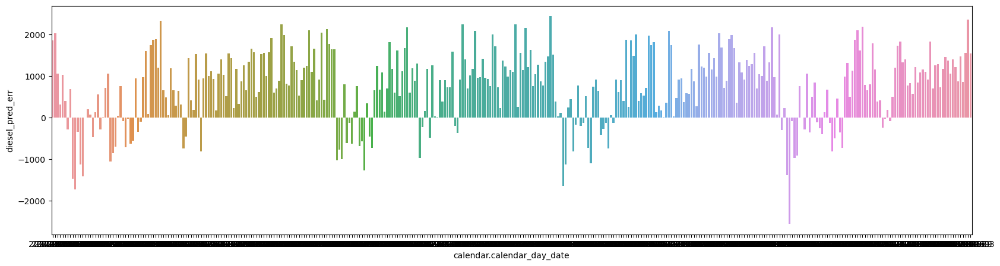

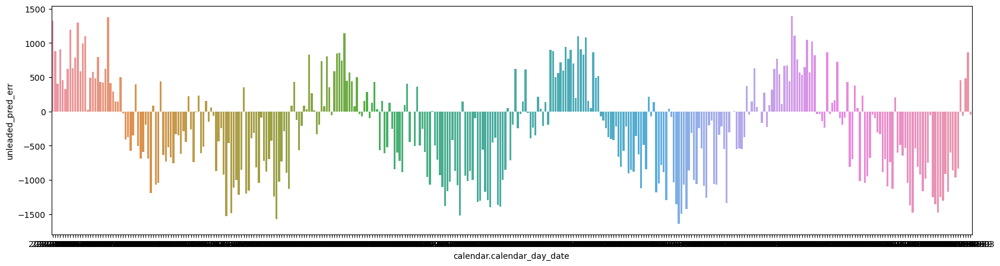

C:\Users\pengo\AppData\Local\Temp\ipykernel_20840\347169114.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  teststore_df['is_pred'] = is_pred
C:\Users\pengo\AppData\Local\Temp\ipykernel_20840\347169114.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  teststore_df['fs_pred'] = fs_pred
C:\Users\pengo\AppData\Local\Temp\ipykernel_20840\347169114.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

Se

Store # 22785
Annual Cumulative Error(Inside Sales):  221434.73972656252
Annual Cumulative Error % (Inside Sales):  21.949571893540156
Annual Cumulative Error(Food Service):  20484.06333325195
Annual Cumulative Error % (Food Service):  6.635945128196361
Annual Cumulative Error(Diesel Sales):  -9007.508366210935
Annual Cumulative Error % (Diesel Sales):  -0.9216452765030423
Annual Cumulative Error(Unleaded Sales):  -179138.34433752438
Annual Cumulative Error % (Unleaded Sales):  -22.628198688840325


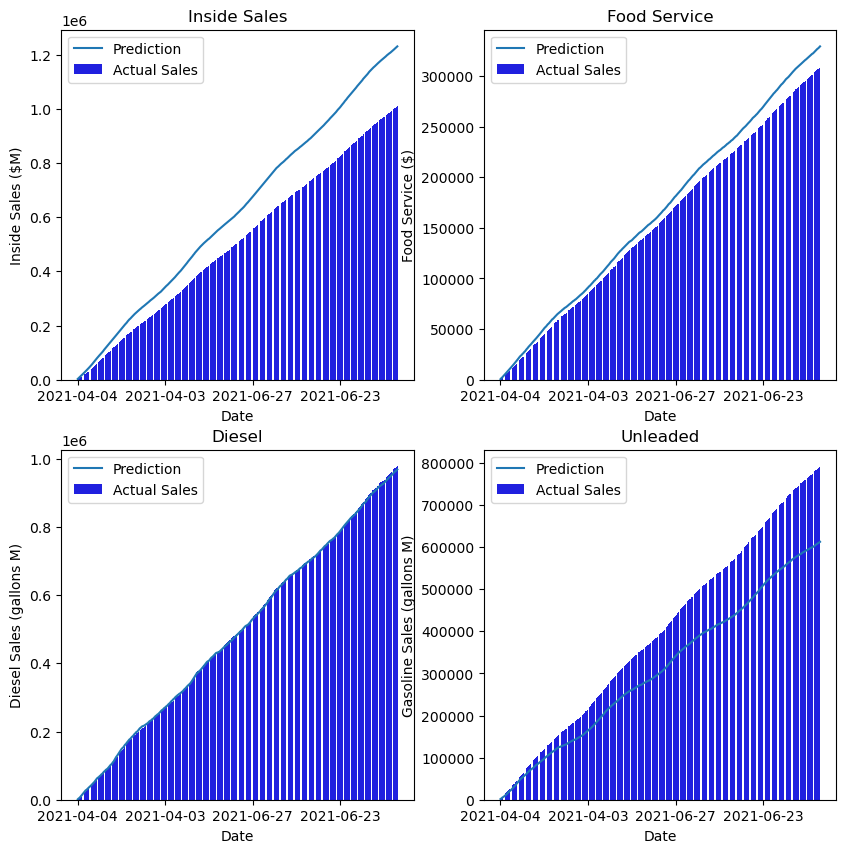

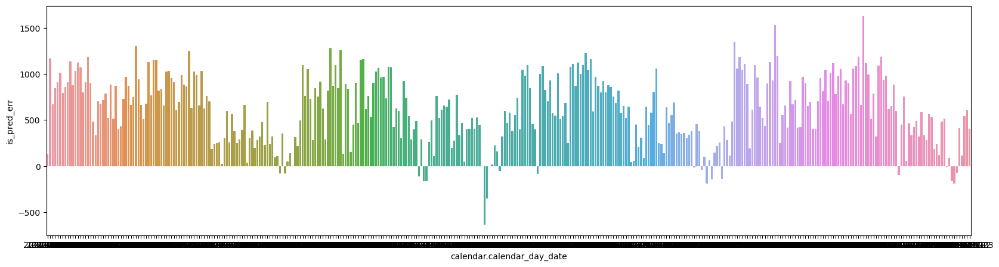

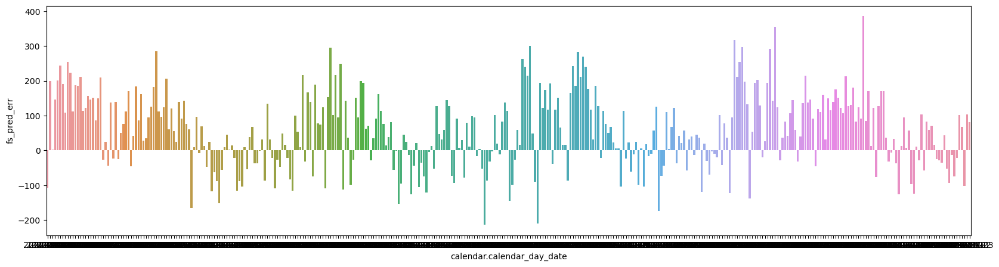

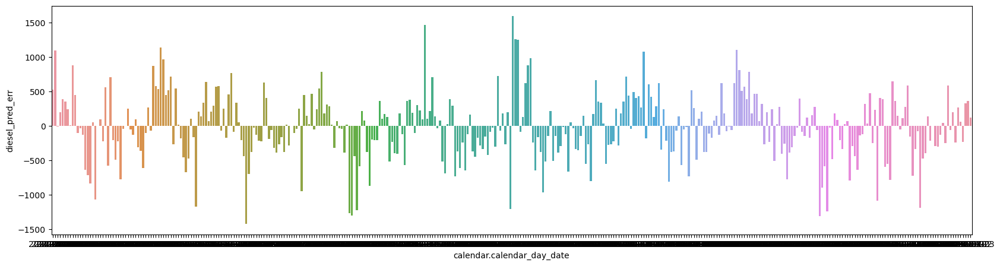

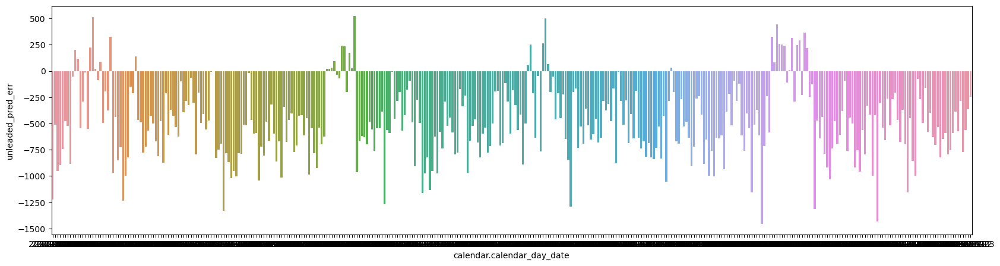

C:\Users\pengo\AppData\Local\Temp\ipykernel_20840\347169114.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  teststore_df['is_pred'] = is_pred
C:\Users\pengo\AppData\Local\Temp\ipykernel_20840\347169114.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  teststore_df['fs_pred'] = fs_pred
C:\Users\pengo\AppData\Local\Temp\ipykernel_20840\347169114.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

Se

Store # 23380
Annual Cumulative Error(Inside Sales):  -77817.51001171875
Annual Cumulative Error % (Inside Sales):  -6.566780060653679
Annual Cumulative Error(Food Service):  -62549.96321679687
Annual Cumulative Error % (Food Service):  -17.52086909825003
Annual Cumulative Error(Diesel Sales):  -149622.01597161865
Annual Cumulative Error % (Diesel Sales):  -19.269721247110418
Annual Cumulative Error(Unleaded Sales):  -239450.2845024414
Annual Cumulative Error % (Unleaded Sales):  -22.586935969977844


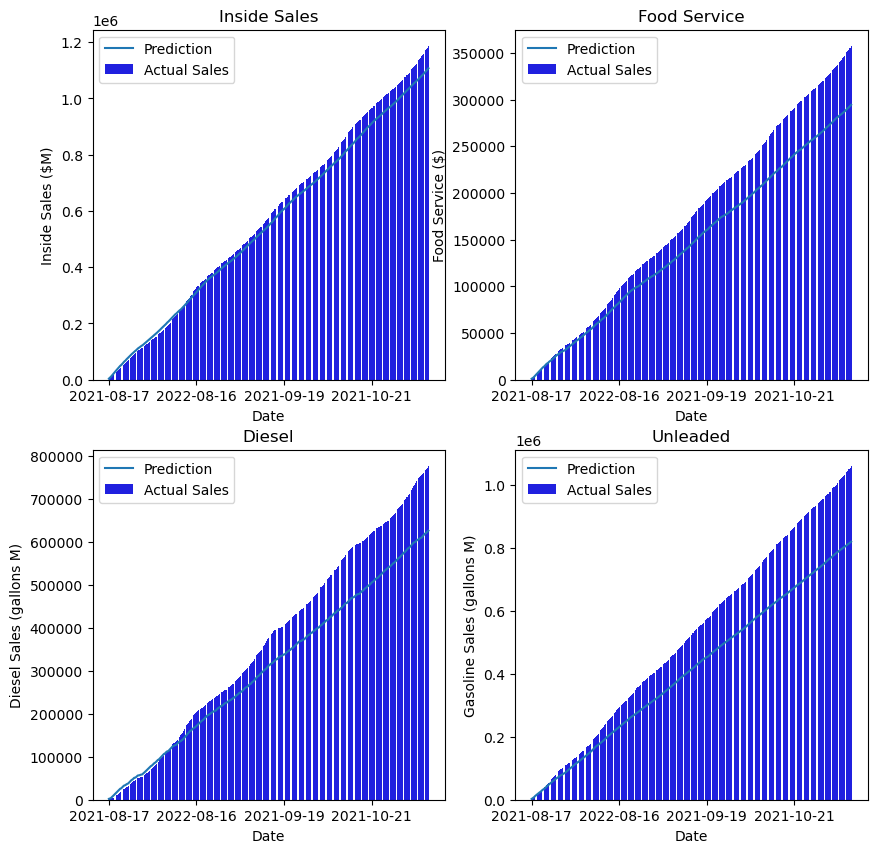

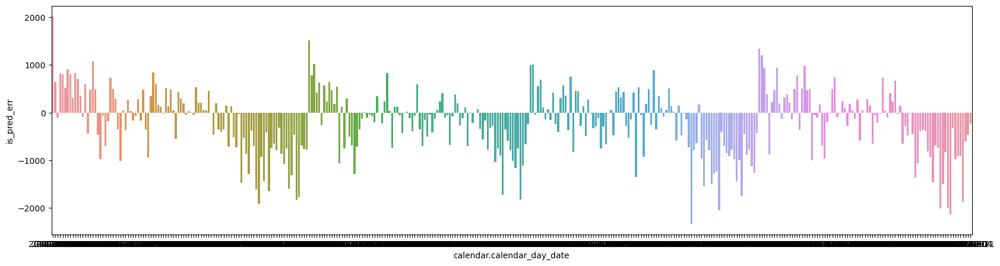

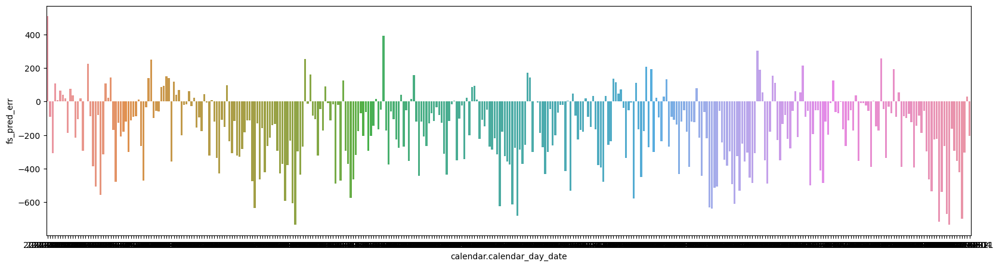

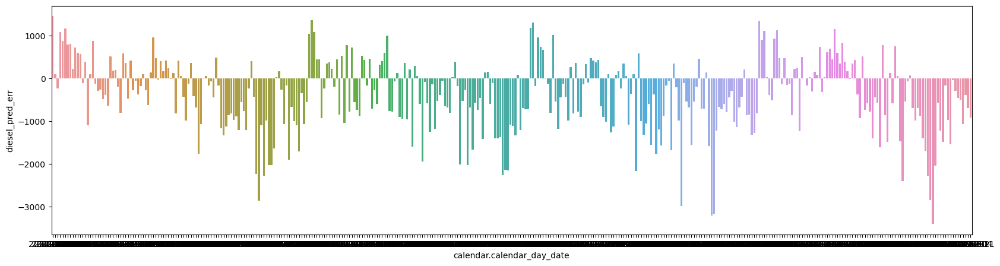

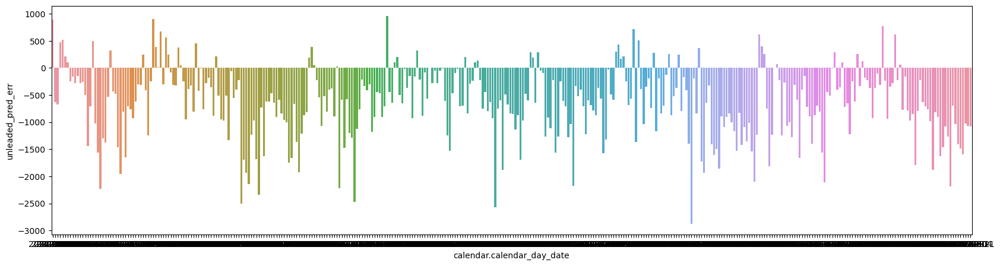

In [20]:
for store in test.values:
    TestStoreAnalysis(store)